## Validation - Synthetic Data - Changing Numbers of Observations

In this notebook we analyze certain cases where the number of observations and number of fit parameters change and how those assumptions affect the best-fit parameters. The modeled asteroid is always the same, ie, has diameter of 1000 m, characteristic temperature of 422 K and an emissivity of 0.7.

- [Case 1: 1 Observation 2 Parameters (Fit: $T_1$, $D$; Assume: $\epsilon$ = 0.7, $\Sigma$ = 0.2)](#Case-1:-1-Observation-2-Parameters-(Fit:-$T_1$,-$D$;-Assume:-$\epsilon$-=-0.7,-$\Sigma$-=-0.2))
- [Case 2: 25 Observations 2 Parameters (Fit: $T_1$, $D$; Assume: $\epsilon$ = 0.7, $\Sigma$ = 0.1)](#Case-2:-25-Observations-2-Parameters-(Fit:-$T_1$,-$D$;-Assume:-$\epsilon$-=-0.7,-$\Sigma$-=-0.1))
- [Case 3: 25 Observations 2 Parameters (Fit: $T_1$, $D$; Assume: $\epsilon$ = 0.8, $\Sigma$ = 0.1)](#Case-3:-25-Observations-2-Parameters-(Fit:-$T_1$,-$D$;-Assume:-$\epsilon$-=-0.8,-$\Sigma$-=-0.1))
- [Case 4: 1 Observation 3 Parameters (Fit: $T_1$, $D$, $\epsilon_{W1W2}$; Assume: $\epsilon_{W3W4}$ = 0.7, $\Sigma$ = 0.2)](#Case-4:-1-Observation-3-Parameters-(Fit:-$T_1$,-$D$,-$\epsilon_{W1W2}$;-Assume:-$\epsilon_{W3W4}$-=-0.7,-$\Sigma$-=-0.2))
- [Case 5: 25 Observations 3 Parameters (Fit: $T_1$, $D$, $\epsilon_{W1W2}$; Assume: $\epsilon_{W3W4}$ = 0.7, $\Sigma$ = 0.1)](#Case-5:-25-Observations-3-Parameters-(Fit:-$T_1$,-$D$,-$\epsilon_{W1W2}$;-Assume:-$\epsilon_{W3W4}$-=-0.7,-$\Sigma$-=-0.1))




This notebook creates Figures 1-4 in the ATM paper.

In [1]:
# Repository locations
ATM_DIR = "/epyc/projects/atm/atm/"
ATM_DATA_DIR = "/epyc/projects/atm/atm_data/"

In [2]:
import os 
import sys
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

sys.path.append(ATM_DIR)

from atm.models import STM, FRM, NEATM
from atm.obs import WISE
from atm import fit
from atm import modifyErrors

# Additonal imports to make simulated data
from atm import Config
from atm.functions import calcTss, calcQ
from atm.functions import interpFluxLambdaObsWithSunlight
from atm.functions import calcFluxLambdaObsWithSunlight
from atm.functions import calcFluxLambdaAtObsWithSunlight
from atm.functions import calcFluxLambdaSED
from atm.plotting import plotObservations, plotSED

%matplotlib inline

In [3]:
DPI = 300
SAVE_DIR = "../plots/"
FORMAT = "png"

SAVE_FIGS = True

In [4]:
m_to_mum = 1e6 # simple conversion from m to micron
km_to_m = 1e3 # conversion km to m

### Case 1: 1 Observation 2 Parameters (Fit: $T_1$, $D$; Assume: $\epsilon$ = 0.7, $\Sigma$ = 0.2)

In [5]:
# Instantiate observatory and NEATM class for simulating data
obs = WISE()
model = NEATM(verbose=False)

In [6]:
# Load WISE quadrature lookup tables into memory 
model.loadLambdaTables(obs.filterQuadratureLambdas, verbose=False)

In [7]:
# Create observing geometry
num_obs = 1
r = np.random.normal(loc=3.0, scale=0.01, size=num_obs)
delta = r - 1.0
alpha = np.zeros(num_obs)

In [8]:
# Fractional flux error of 0.1% (will add 0.2 mag Sigma later)
err = 0.001

In [9]:
# Create fake asteroid
# Here we set a value of T1, we could also explicitly calculate T_ss 
#   using atm.functions.calcTss and from there calculate T1, however this is not needed 
#   for this example
G = 0.15 * np.ones(num_obs)
D = 1000 * np.ones(num_obs)
logD = np.log10(D) * np.ones(num_obs)
eps = np.array(0.70) * np.ones(num_obs)
p = (1 - eps) / calcQ(G)
T1 = 422. * np.ones(num_obs)
logT1 = np.log10(T1)
T_ss = T1 / np.sqrt(r)

In [10]:
# Model flux with sunlight
flux = interpFluxLambdaObsWithSunlight(model, obs, r, delta, T_ss, D, alpha, eps, p, G).T
fluxErr = err * flux
mag = obs.convertFluxLambdaToMag(flux)
magErr = obs.convertFluxLambdaErrToMagErr(flux, fluxErr)

data = np.vstack([r, delta, alpha, G, D, logD, T1, logT1, T_ss,
                  flux[:, 0], flux[:, 1], flux[:, 2], flux[:, 3],
                  fluxErr[:, 0], fluxErr[:, 1], fluxErr[:, 2], fluxErr[:, 3],
                  mag[:, 0], mag[:, 1], mag[:, 2], mag[:, 3],
                  magErr[:, 0], magErr[:, 1], magErr[:, 2], magErr[:, 3]])

data = pd.DataFrame(data.T, columns=["r",
                                     "delta",
                                     "alpha",
                                     "G",
                                     "D",
                                     "logD",
                                     "T1",
                                     "logT1",
                                     "T_ss",
                                     "flux_W1_si",
                                     "flux_W2_si",
                                     "flux_W3_si",
                                     "flux_W4_si",
                                     "fluxErr_W1_si",
                                     "fluxErr_W2_si",
                                     "fluxErr_W3_si",
                                     "fluxErr_W4_si",
                                     "mag_W1",
                                     "mag_W2",
                                     "mag_W3",
                                     "mag_W4",
                                     "magErr_W1",
                                     "magErr_W2",
                                     "magErr_W3",
                                     "magErr_W4"])
data["obs_id"] = np.arange(1, len(data) + 1)
data["eps"] = eps 
data["p"] = p
data["designation"] = ["0000" for i in range(len(data))]
data = data[["obs_id", "designation", "r", "delta", "alpha", "G", "D", "logD", "T1", "logT1", "T_ss", "eps", "p",
             "flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si", 
             "fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si",
             "mag_W1", "mag_W2", "mag_W3", "mag_W4",
             "magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]]

In [11]:
columnMapping = {
    "designation" : "designation",
    "obs_id" : "obs_id",
    "r_au" : "r",
    "delta_au" : "delta",
    "alpha_rad" : "alpha",
    "G" : "G",
    "logT1" : "logT1",
    "logD": "logD",
    "eps" : "eps", 
    "flux_si": ["flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si"],
    "fluxErr_si": ["fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si"],
    "mag" : ["mag_W1", "mag_W2", "mag_W3", "mag_W4"],
    "magErr" : ["magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]
}
fitParameters = ["logT1", "logD"]
fitFilters = "all"
emissivitySpecification = None
albedoSpecification = "auto"

# Wavelength config for calculating SEDs
lambdaRange=[1e-6, 30e-6]
lambdaNum=250
lambdaEdges=[3.9e-6, 6.5e-6, 18.5e-6]
linearInterpolation=False

In [12]:
# Modify errors: add sigma of 0.2 mag to account for rotation
data = modifyErrors(data, obs, sigma=0.2, columnMapping=columnMapping)

Added 0.2 magnitude errors to magErr_W1.
Added 0.2 magnitude errors to magErr_W2.
Added 0.2 magnitude errors to magErr_W3.
Added 0.2 magnitude errors to magErr_W4.
Converted magnitude errors to flux errors.
Updating fluxErr_W1_si with new error.
Updating fluxErr_W2_si with new error.
Updating fluxErr_W3_si with new error.
Updating fluxErr_W4_si with new error.
Done.



In [13]:
data

,obs_id,designation,r,delta,alpha,G,D,logD,T1,logT1,...,fluxErr_W3_si,fluxErr_W4_si,mag_W1,mag_W2,mag_W3,mag_W4,magErr_W1,magErr_W2,magErr_W3,magErr_W4
0,1,0000,2.987497,1.987497,0.0,0.15,1000.0,3.0,422.0,2.625312,...,2.281794e-12,1.396385e-12,18.144434,17.811055,11.79604,9.518762,0.201086,0.201086,0.201086,0.201086


In [14]:
# Generate truth at a variety of wavelengths for plotting
model = NEATM(verbose=False)

SED_neatm = calcFluxLambdaSED(model, obs, data,
                              emissivitySpecification=emissivitySpecification,
                              albedoSpecification=albedoSpecification,
                              columnMapping=columnMapping,
                              lambdaRange=lambdaRange,
                              lambdaNum=lambdaNum,
                              lambdaEdges=lambdaEdges,
                              linearInterpolation=linearInterpolation)   

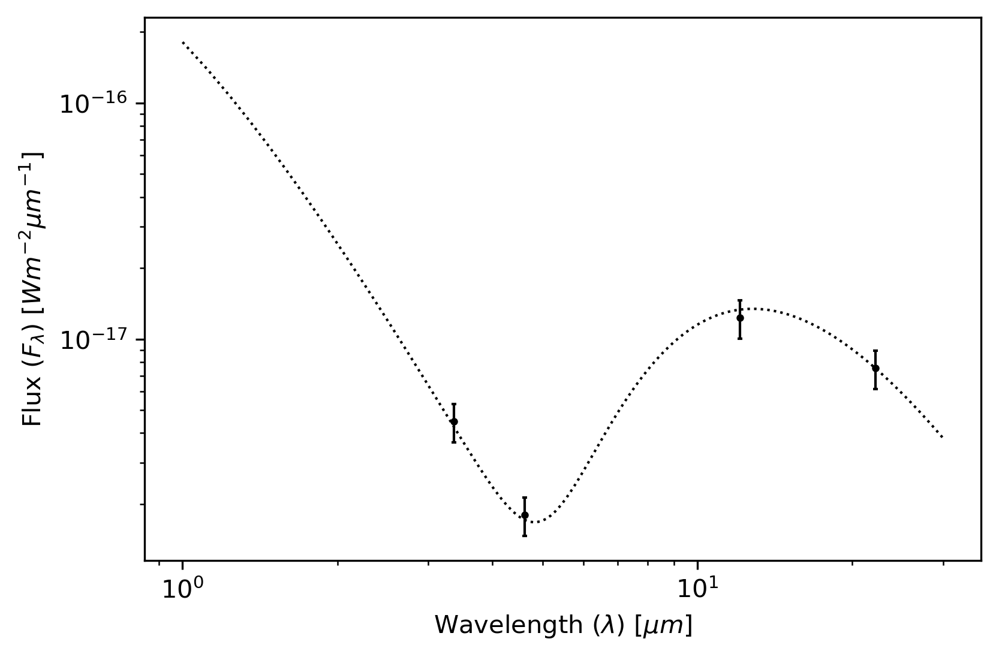

In [15]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm, ax=ax)
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)

Fitting 0000 with STM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 1
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.625 +- 0.022
 logD:  2.996 +- 0.038
Total time: 42.76 seconds
Done.



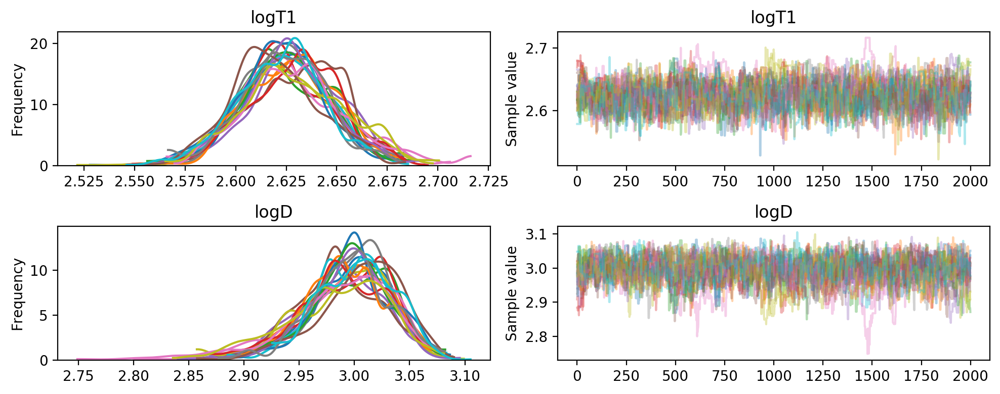

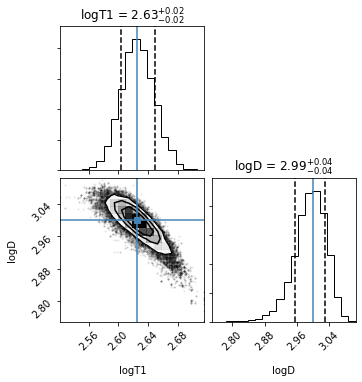

In [16]:
# Run STM
model = STM(verbose=False)
summary_stm, model_observations_stm, pymc_objs_stm = fit(
    model, 
    obs, 
    data,
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with FRM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 1
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.600 +- 0.023
 logD:  2.996 +- 0.037
Total time: 33.40 seconds
Done.



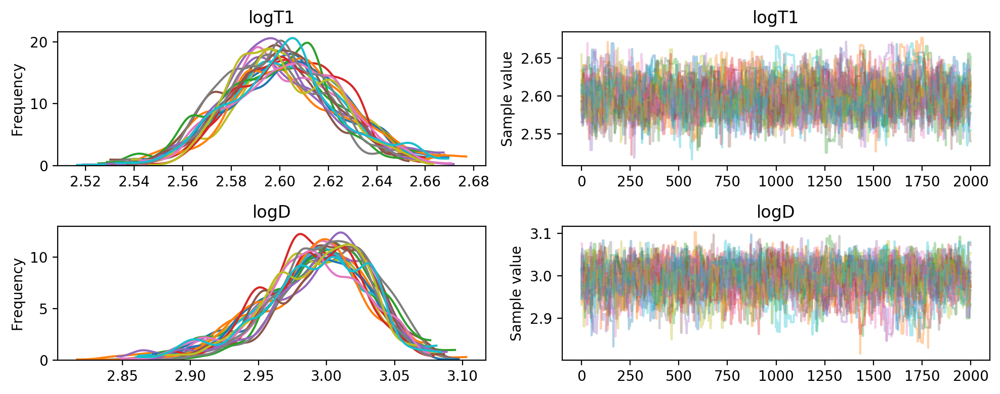

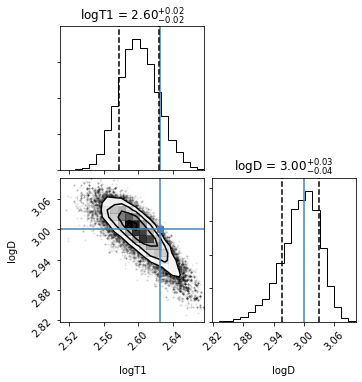

In [17]:
# Run FRM
model = FRM(verbose=False)
summary_frm, model_observations_frm, pymc_objs_frm = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with NEATM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 1
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.625 +- 0.023
 logD:  2.995 +- 0.038
Total time: 33.58 seconds
Done.



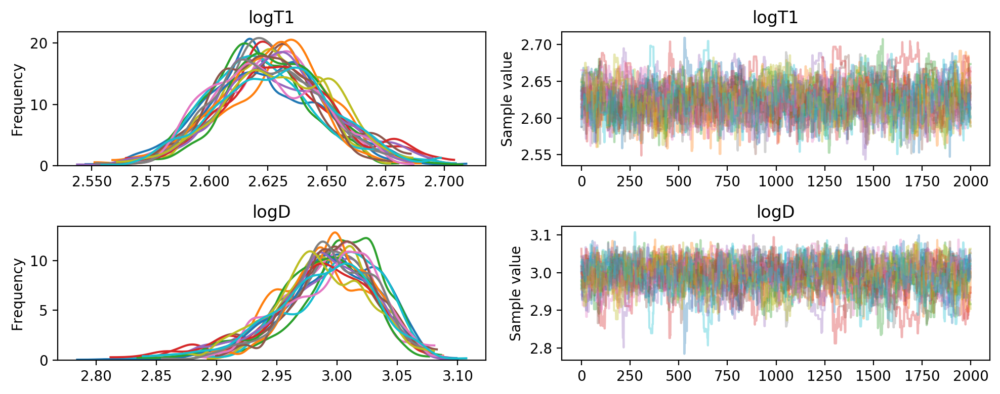

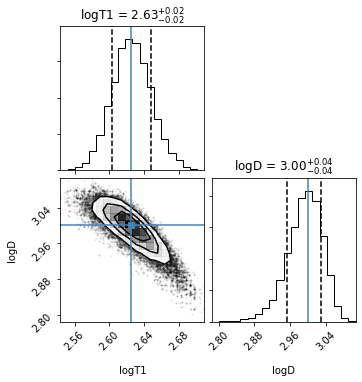

In [18]:
# Run NEATM
model = NEATM(verbose=False)
summary_neatm, model_observations_neatm, pymc_objs_neatm, figs = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    returnFigs=True,
    verbose=False)
if SAVE_FIGS is True:
    fig_corner = figs[1]
    fig_corner.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case1_NEATM_corner".format(FORMAT)), 
                       bbox_inches='tight',
                       dpi=DPI)

In [19]:
# Truth parameters
data[fitParameters]

,logT1,logD
0,2.625312,3.0


In [20]:
# Fitting results
summary_stm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,STM,1,logT1,2.624921,0.022217,2.625392,0.022558,0.000759,1195.441630,1.009159,2.581653,2.670130
1,0000,STM,1,logD,2.996206,0.037625,2.993079,0.038936,0.001411,1014.241926,1.011051,2.912445,3.061789


In [21]:
# Fitting results
summary_frm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,FRM,1,logT1,2.600314,0.023132,2.601045,0.022747,0.000671,1299.259025,1.006718,2.558483,2.646321
1,0000,FRM,1,logD,2.996230,0.037205,2.992621,0.038322,0.001184,1187.334323,1.007804,2.915060,3.064749


In [22]:
# Fitting results
summary_neatm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,NEATM,1,logT1,2.625373,0.022722,2.625947,0.022765,0.000771,956.793990,1.008653,2.580728,2.669758
1,0000,NEATM,1,logD,2.995096,0.037972,2.991858,0.039369,0.001344,940.430482,1.009158,2.912476,3.063190


In [23]:
pred_D = 10**summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
pred_D_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logD"]["sigmaG"].values[0]) - pred_D
truth_D = 10**data["logD"].values[0]
percent_diff = (pred_D / truth_D - 1) * 100.
print("delta D [%]: {:.3f}".format(percent_diff))
print("pred D [m]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_D, 
                                                      pred_D_sigma, 
                                                      pred_D_sigma / pred_D * 100.))
print("")

pred_T1 = 10**summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
pred_T1_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logT1"]["sigmaG"].values[0]) - pred_T1
truth_T1 = 10**data["logT1"].values[0]
percent_diff = (pred_T1 / truth_T1 - 1) * 100.
print("delta T1 [%]: {:.3f}".format(percent_diff))
print("pred T1 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_T1, 
                                                       pred_T1_sigma, 
                                                       pred_T1_sigma / pred_T1 * 100.))

delta D [%]: -1.123
pred D [m]: 988.772 +- 90.345 [9.137%]

delta T1 [%]: 0.014
pred T1 [K]: 422.059 +- 22.670 [5.371%]


In [24]:
# Use best-fit parameters to model fluxes
model = STM(verbose=False)

SED_stm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_stm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)   

# Use best-fit parameters to model fluxes
model = FRM(verbose=False)

SED_frm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_frm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)       

# Use best-fit parameters to model fluxes
model = NEATM(verbose=False)

SED_neatm_fit = calcFluxLambdaSED(model, obs, data,
                                  summary=summary_neatm,
                                  fitParameters=fitParameters,
                                  emissivitySpecification=emissivitySpecification,
                                  albedoSpecification=albedoSpecification,
                                  columnMapping=columnMapping,
                                  lambdaRange=lambdaRange,
                                  lambdaNum=lambdaNum,
                                  lambdaEdges=lambdaEdges,
                                  linearInterpolation=linearInterpolation)       


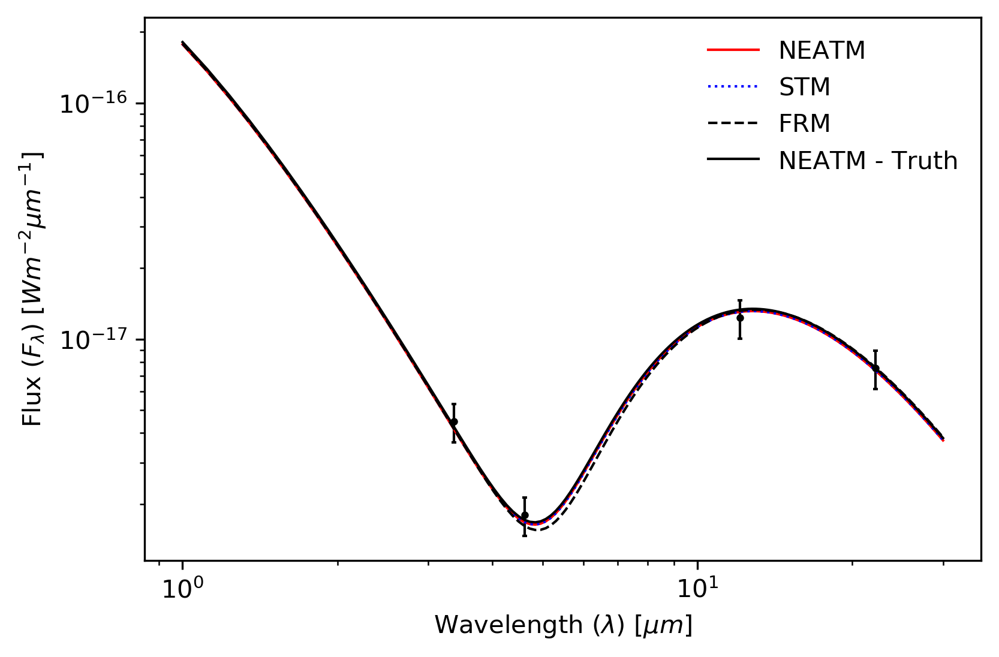

In [25]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm_fit, 
        ax=ax, 
        plotKwargs={"label": "NEATM", 
                    "c": "r", 
                    "lw": 1})
plotSED(SED_stm_fit, 
        ax=ax, 
        plotKwargs={"label": "STM", 
                    "c": "b", 
                    "ls": ":", 
                    "lw": 1})
plotSED(SED_frm_fit, 
        ax=ax, 
        plotKwargs={"label": "FRM", 
                    "c": "k", 
                    "ls": "--", 
                    "lw": 1})
plotSED(SED_neatm, 
        ax=ax, 
        plotKwargs={"label":"NEATM - Truth", 
                    "c" : "k" , 
                    "lw": 1})
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)
ax.legend(frameon=False)
if SAVE_FIGS is True:
    fig.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case1_SEDs".format(FORMAT)), 
                bbox_inches='tight',
                dpi=DPI)

### Case 2: 25 Observations 2 Parameters (Fit: $T_1$, $D$; Assume: $\epsilon$ = 0.7, $\Sigma$ = 0.1)

In [26]:
# Instantiate observatory and NEATM class for simulating data
obs = WISE()
model = NEATM(verbose=False)

In [27]:
# Load WISE quadrature lookup tables into memory 
model.loadLambdaTables(obs.filterQuadratureLambdas, verbose=False)

In [28]:
# Create observing geometry
num_obs = 25
r = np.random.normal(loc=3.0, scale=0.01, size=num_obs)
delta = r - 1.0
alpha = np.zeros(num_obs)

In [29]:
# Fractional flux error of 0.1% (will add 0.2 mag Sigma later)
err = 0.001

In [30]:
# Create fake asteroid
# Here we set a value of T1, we could also explicitly calculate T_ss 
#   using atm.functions.calcTss and from there calculate T1, however this is not needed 
#   for this example
G = 0.15 * np.ones(num_obs)
D = 1000 * np.ones(num_obs)
logD = np.log10(D) * np.ones(num_obs)
eps = np.array(0.70) * np.ones(num_obs)
p = (1 - eps) / calcQ(G)
T1 = 422. * np.ones(num_obs)
logT1 = np.log10(T1)
T_ss = T1 / np.sqrt(r)

In [31]:
# Model flux with sunlight
flux = interpFluxLambdaObsWithSunlight(model, obs, r, delta, T_ss, D, alpha, eps, p, G).T
fluxErr = err * flux
mag = obs.convertFluxLambdaToMag(flux)
magErr = obs.convertFluxLambdaErrToMagErr(flux, fluxErr)

data = np.vstack([r, delta, alpha, G, D, logD, T1, logT1, T_ss,
                  flux[:, 0], flux[:, 1], flux[:, 2], flux[:, 3],
                  fluxErr[:, 0], fluxErr[:, 1], fluxErr[:, 2], fluxErr[:, 3],
                  mag[:, 0], mag[:, 1], mag[:, 2], mag[:, 3],
                  magErr[:, 0], magErr[:, 1], magErr[:, 2], magErr[:, 3]])

data = pd.DataFrame(data.T, columns=["r",
                                     "delta",
                                     "alpha",
                                     "G",
                                     "D",
                                     "logD",
                                     "T1",
                                     "logT1",
                                     "T_ss",
                                     "flux_W1_si",
                                     "flux_W2_si",
                                     "flux_W3_si",
                                     "flux_W4_si",
                                     "fluxErr_W1_si",
                                     "fluxErr_W2_si",
                                     "fluxErr_W3_si",
                                     "fluxErr_W4_si",
                                     "mag_W1",
                                     "mag_W2",
                                     "mag_W3",
                                     "mag_W4",
                                     "magErr_W1",
                                     "magErr_W2",
                                     "magErr_W3",
                                     "magErr_W4"])
data["obs_id"] = np.arange(1, len(data) + 1)
data["eps"] = eps
data["p"] = p
data["designation"] = ["0000" for i in range(len(data))]
data = data[["obs_id", "designation", "r", "delta", "alpha", "G", "D", "logD", "T1", "logT1", "T_ss", 
             "eps", "p",
             "flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si", 
             "fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si",
             "mag_W1", "mag_W2", "mag_W3", "mag_W4",
             "magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]]

In [32]:
columnMapping = {
    "designation" : "designation",
    "obs_id" : "obs_id",
    "r_au" : "r",
    "delta_au" : "delta",
    "alpha_rad" : "alpha",
    "G" : "G",
    "logT1" : "logT1",
    "logD": "logD",
    "eps" : "eps",
    "p" : "p",
    "flux_si": ["flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si"],
    "fluxErr_si": ["fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si"],
    "mag" : ["mag_W1", "mag_W2", "mag_W3", "mag_W4"],
    "magErr" : ["magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]
}
fitParameters = ["logT1", "logD"]
fitFilters = "all"
emissivitySpecification = None
albedoSpecification = "auto"

# Wavelength config for calculating SEDs
lambdaRange=[1e-6, 30e-6]
lambdaNum=250
lambdaEdges=[3.9e-6, 6.5e-6, 18.5e-6]
linearInterpolation=False

In [33]:
# Modify errors: add sigma of 0.1 mag to account for rotation
data = modifyErrors(data, obs, sigma=0.1, columnMapping=columnMapping)

Added 0.1 magnitude errors to magErr_W1.
Added 0.1 magnitude errors to magErr_W2.
Added 0.1 magnitude errors to magErr_W3.
Added 0.1 magnitude errors to magErr_W4.
Converted magnitude errors to flux errors.
Updating fluxErr_W1_si with new error.
Updating fluxErr_W2_si with new error.
Updating fluxErr_W3_si with new error.
Updating fluxErr_W4_si with new error.
Done.



In [34]:
data

,obs_id,designation,r,delta,alpha,G,D,logD,T1,logT1,...,fluxErr_W3_si,fluxErr_W4_si,mag_W1,mag_W2,mag_W3,mag_W4,magErr_W1,magErr_W2,magErr_W3,magErr_W4
0,1,0000,2.998444,1.998444,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.123969e-12,6.903354e-13,18.164410,17.834974,11.818117,9.536897,0.101086,0.101086,0.101086,0.101086
1,2,0000,3.000578,2.000578,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.119534e-12,6.880977e-13,18.168291,17.839618,11.822409,9.540422,0.101086,0.101086,0.101086,0.101086
2,3,0000,3.000379,2.000379,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.119946e-12,6.883055e-13,18.167930,17.839186,11.822010,9.540094,0.101086,0.101086,0.101086,0.101086
3,4,0000,3.010575,2.010575,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.099030e-12,6.777332e-13,18.186432,17.861305,11.842479,9.556900,0.101086,0.101086,0.101086,0.101086
4,5,0000,3.021396,2.021396,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.077340e-12,6.667351e-13,18.205977,17.884639,11.864120,9.574664,0.101086,0.101086,0.101086,0.101086
5,6,0000,2.982161,1.982161,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.158518e-12,7.077201e-13,18.134662,17.799340,11.785246,9.509893,0.101086,0.101086,0.101086,0.101086
6,7,0000,3.015130,2.015130,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.089835e-12,6.730752e-13,18.194672,17.871146,11.851600,9.564388,0.101086,0.101086,0.101086,0.101086
7,8,0000,3.011239,2.011239,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.097684e-12,6.770516e-13,18.187634,17.862741,11.843809,9.557992,0.101086,0.101086,0.101086,0.101086
8,9,0000,2.994356,1.994356,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.132525e-12,6.946487e-13,18.156962,17.826059,11.809883,9.530134,0.101086,0.101086,0.101086,0.101086
9,10,0000,2.984933,1.984933,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.152547e-12,7.047217e-13,18.139741,17.805430,11.790856,9.514503,0.101086,0.101086,0.101086,0.101086


In [35]:
# Generate truth at a variety of wavelengths for plotting
model = NEATM(verbose=False)

SED_neatm = calcFluxLambdaSED(model, obs, data,
                              emissivitySpecification=emissivitySpecification,
                              albedoSpecification=albedoSpecification,
                              columnMapping=columnMapping,
                              lambdaRange=lambdaRange,
                              lambdaNum=lambdaNum,
                              lambdaEdges=lambdaEdges,
                              linearInterpolation=linearInterpolation)   

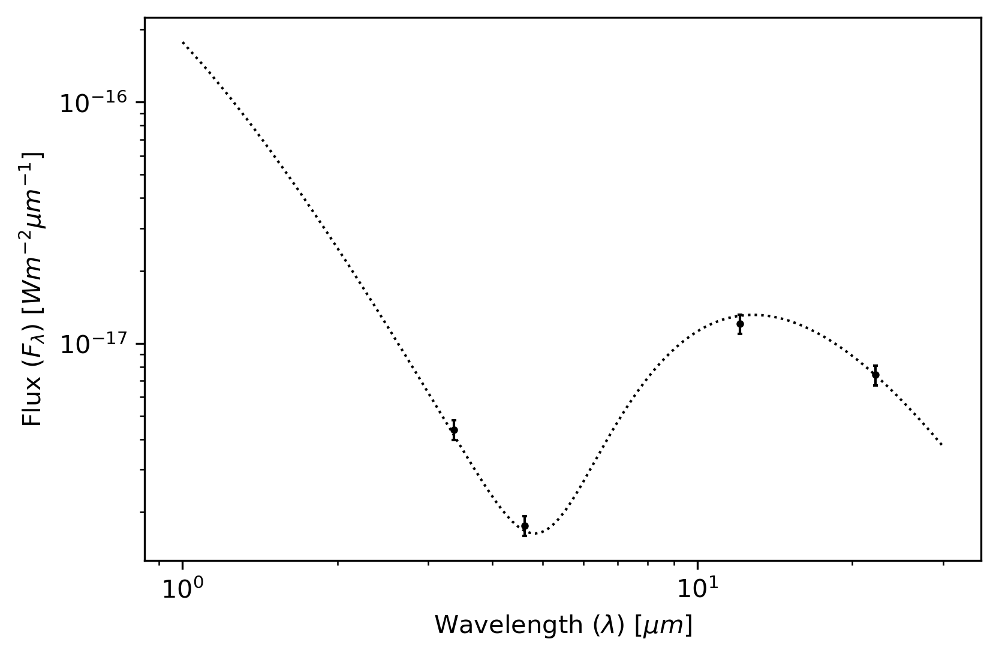

In [36]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm, ax=ax)
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)

Fitting 0000 with STM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.625 +- 0.002
 logD:  3.000 +- 0.004
Total time: 34.52 seconds
Done.



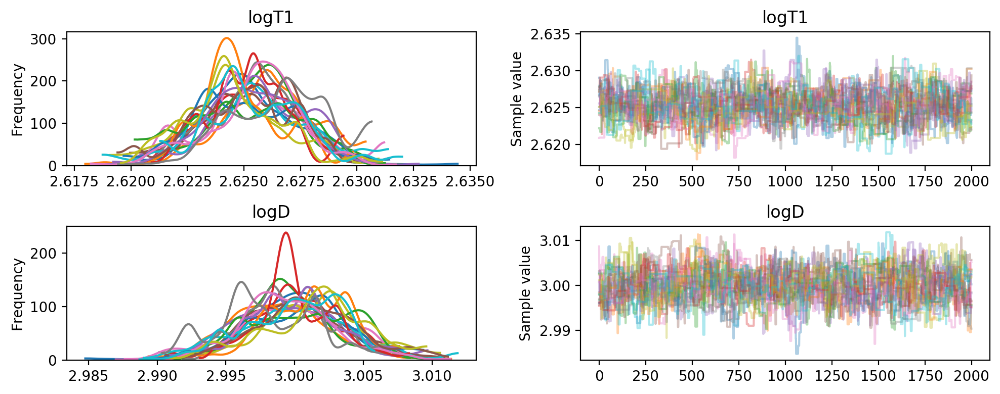

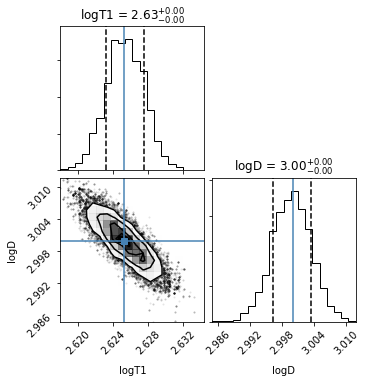

In [37]:
# Run STM
model = STM(verbose=False)
summary_stm, model_observations_stm, pymc_objs_stm = fit(
    model, 
    obs, 
    data,
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with FRM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.599 +- 0.002
 logD:  3.002 +- 0.004
Total time: 26.92 seconds
Done.



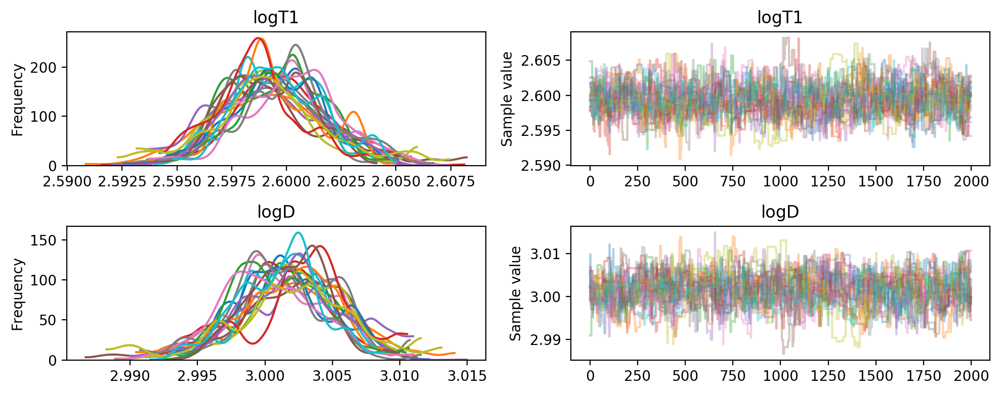

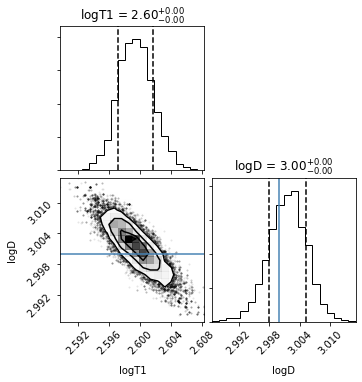

In [38]:
# Run FRM
model = FRM(verbose=False)
summary_frm, model_observations_frm, pymc_objs_frm = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with NEATM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.625 +- 0.002
 logD:  3.000 +- 0.004
Total time: 38.14 seconds
Done.



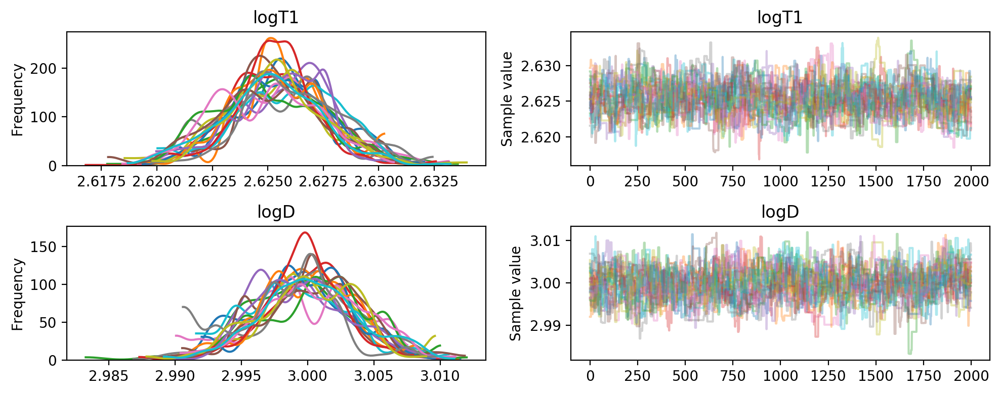

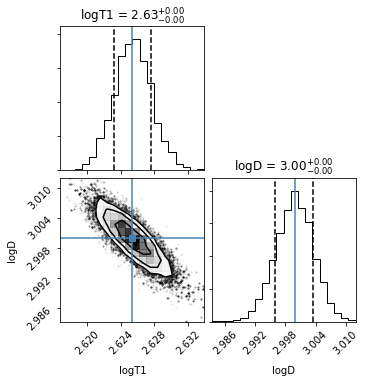

In [39]:
# Run NEATM
model = NEATM(verbose=False)
summary_neatm, model_observations_neatm, pymc_objs_neatm, figs = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    returnFigs=True,
    verbose=False)
if SAVE_FIGS is True:
    fig_corner = figs[1]
    fig_corner.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case2_NEATM_corner".format(FORMAT)), 
                       bbox_inches='tight',
                       dpi=DPI)

In [40]:
# Truth parameters
data[fitParameters]

,logT1,logD
0,2.625312,3.0
1,2.625312,3.0
2,2.625312,3.0
3,2.625312,3.0
4,2.625312,3.0
5,2.625312,3.0
6,2.625312,3.0
7,2.625312,3.0
8,2.625312,3.0
9,2.625312,3.0


In [41]:
# Fitting results
summary_stm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,STM,1,logT1,2.625299,0.002172,2.625317,0.002181,0.000100,537.058942,1.025594,2.620921,2.629448
1,0000,STM,1,logD,2.999902,0.003672,2.999930,0.003628,0.000165,555.637561,1.025308,2.992419,3.006855


In [42]:
# Fitting results
summary_frm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,FRM,1,logT1,2.599299,0.002231,2.599407,0.002280,0.000092,688.700799,1.015751,2.595115,2.604117
1,0000,FRM,1,logD,3.001671,0.003621,3.001569,0.003711,0.000150,687.231061,1.015423,2.993605,3.008258


In [43]:
# Fitting results
summary_neatm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,NEATM,1,logT1,2.625443,0.002213,2.625428,0.002230,0.000095,650.595428,1.016260,2.621298,2.630091
1,0000,NEATM,1,logD,2.999788,0.003634,2.999738,0.003737,0.000156,668.543603,1.015086,2.992250,3.006858


In [44]:
pred_D = 10**summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
pred_D_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logD"]["sigmaG"].values[0]) - pred_D
truth_D = 10**data["logD"].values[0]
percent_diff = (pred_D / truth_D - 1) * 100.
print("delta D [%]: {:.3f}".format(percent_diff))
print("pred D [m]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_D, 
                                                      pred_D_sigma, 
                                                      pred_D_sigma / pred_D * 100.))
print("")

pred_T1 = 10**summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
pred_T1_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logT1"]["sigmaG"].values[0]) - pred_T1
truth_T1 = 10**data["logT1"].values[0]
percent_diff = (pred_T1 / truth_T1 - 1) * 100.
print("delta T1 [%]: {:.3f}".format(percent_diff))
print("pred T1 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_T1, 
                                                       pred_T1_sigma, 
                                                       pred_T1_sigma / pred_T1 * 100.))

delta D [%]: -0.049
pred D [m]: 999.511 +- 8.399 [0.840%]

delta T1 [%]: 0.030
pred T1 [K]: 422.127 +- 2.156 [0.511%]


In [45]:
# Use best-fit parameters to model fluxes
model = STM(verbose=False)

SED_stm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_stm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)   

# Use best-fit parameters to model fluxes
model = FRM(verbose=False)

SED_frm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_frm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)       

# Use best-fit parameters to model fluxes
model = NEATM(verbose=False)

SED_neatm_fit = calcFluxLambdaSED(model, obs, data,
                                  summary=summary_neatm,
                                  fitParameters=fitParameters,
                                  emissivitySpecification=emissivitySpecification,
                                  albedoSpecification=albedoSpecification,
                                  columnMapping=columnMapping,
                                  lambdaRange=lambdaRange,
                                  lambdaNum=lambdaNum,
                                  lambdaEdges=lambdaEdges,
                                  linearInterpolation=linearInterpolation)       


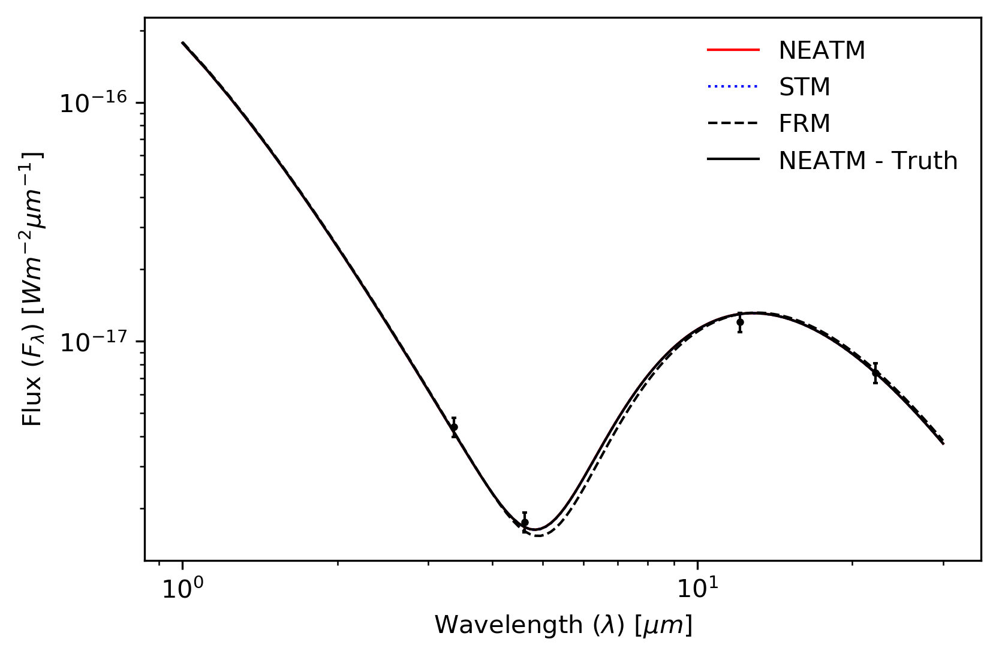

In [46]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm_fit, 
        ax=ax, 
        plotKwargs={"label": "NEATM", 
                    "c": "r", 
                    "lw": 1})
plotSED(SED_stm_fit, 
        ax=ax, 
        plotKwargs={"label": "STM", 
                    "c": "b", 
                    "ls": ":", 
                    "lw": 1})
plotSED(SED_frm_fit, 
        ax=ax, 
        plotKwargs={"label": "FRM", 
                    "c": "k", 
                    "ls": "--", 
                    "lw": 1})
plotSED(SED_neatm, 
        ax=ax, 
        plotKwargs={"label":"NEATM - Truth", 
                    "c" : "k" , 
                    "lw": 1})
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)
ax.legend(frameon=False)
if SAVE_FIGS is True:
    fig.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case2_SEDs".format(FORMAT)), 
                bbox_inches='tight',
                dpi=DPI)

### Case 3: 25 Observations 2 Parameters (Fit: $T_1$, $D$; Assume: $\epsilon$ = 0.8, $\Sigma$ = 0.1)

In [47]:
# Use same data as Case 2 but this time assume epsilon to be 0.8, priors
# are read from columns specified in the columnMapping dictionary 
# so we simply add 0.1 to the epsilon columns
data["eps"] += 0.1
data

,obs_id,designation,r,delta,alpha,G,D,logD,T1,logT1,...,fluxErr_W3_si,fluxErr_W4_si,mag_W1,mag_W2,mag_W3,mag_W4,magErr_W1,magErr_W2,magErr_W3,magErr_W4
0,1,0000,2.998444,1.998444,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.123969e-12,6.903354e-13,18.164410,17.834974,11.818117,9.536897,0.101086,0.101086,0.101086,0.101086
1,2,0000,3.000578,2.000578,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.119534e-12,6.880977e-13,18.168291,17.839618,11.822409,9.540422,0.101086,0.101086,0.101086,0.101086
2,3,0000,3.000379,2.000379,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.119946e-12,6.883055e-13,18.167930,17.839186,11.822010,9.540094,0.101086,0.101086,0.101086,0.101086
3,4,0000,3.010575,2.010575,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.099030e-12,6.777332e-13,18.186432,17.861305,11.842479,9.556900,0.101086,0.101086,0.101086,0.101086
4,5,0000,3.021396,2.021396,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.077340e-12,6.667351e-13,18.205977,17.884639,11.864120,9.574664,0.101086,0.101086,0.101086,0.101086
5,6,0000,2.982161,1.982161,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.158518e-12,7.077201e-13,18.134662,17.799340,11.785246,9.509893,0.101086,0.101086,0.101086,0.101086
6,7,0000,3.015130,2.015130,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.089835e-12,6.730752e-13,18.194672,17.871146,11.851600,9.564388,0.101086,0.101086,0.101086,0.101086
7,8,0000,3.011239,2.011239,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.097684e-12,6.770516e-13,18.187634,17.862741,11.843809,9.557992,0.101086,0.101086,0.101086,0.101086
8,9,0000,2.994356,1.994356,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.132525e-12,6.946487e-13,18.156962,17.826059,11.809883,9.530134,0.101086,0.101086,0.101086,0.101086
9,10,0000,2.984933,1.984933,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.152547e-12,7.047217e-13,18.139741,17.805430,11.790856,9.514503,0.101086,0.101086,0.101086,0.101086


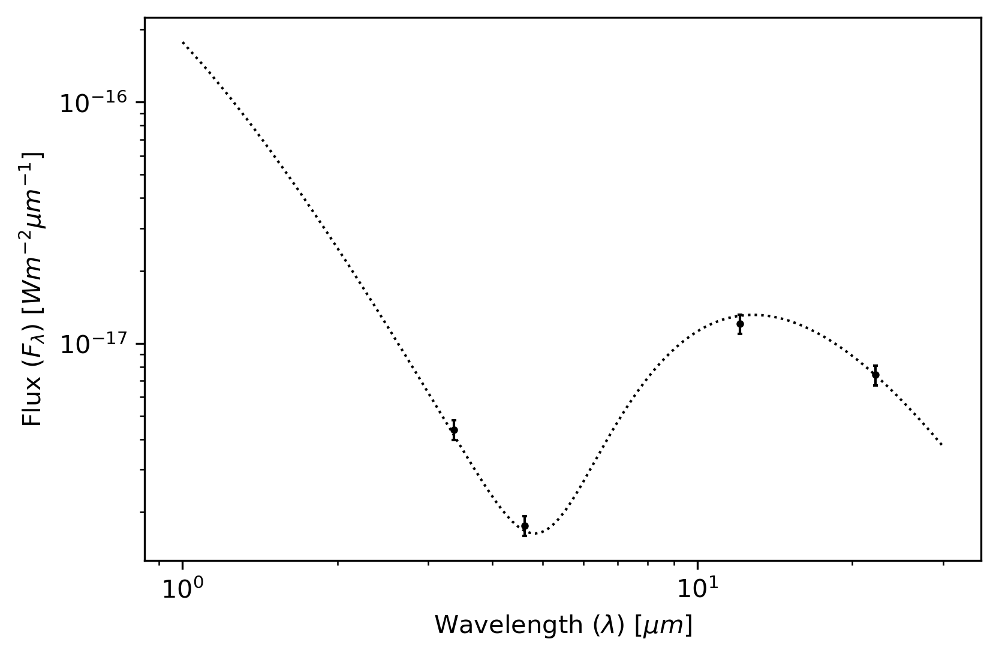

In [48]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm, ax=ax)
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)

Fitting 0000 with STM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.571 +- 0.002
 logD:  3.093 +- 0.003
Total time: 27.21 seconds
Done.



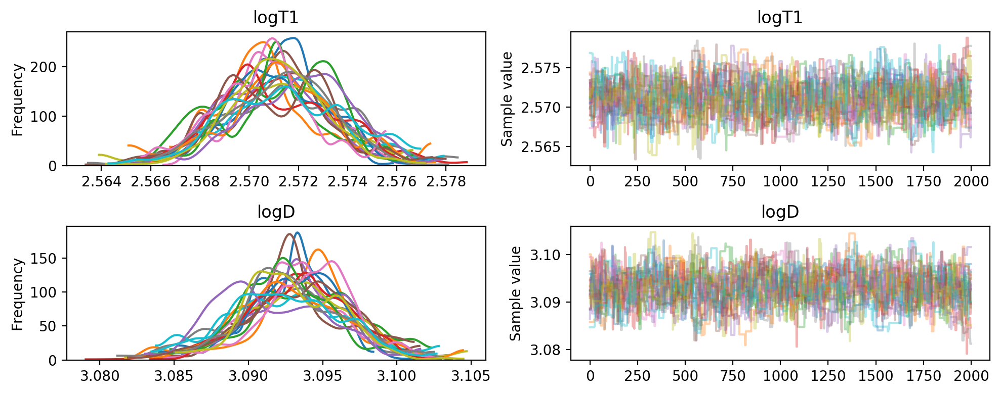

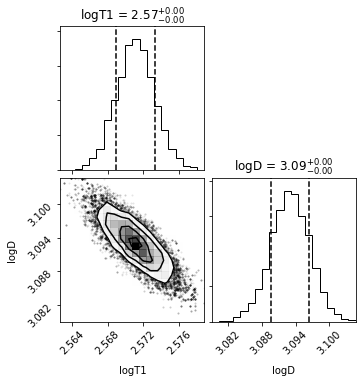

In [49]:
# Run STM
model = STM(verbose=False)
summary_stm, model_observations_stm, pymc_objs_stm = fit(
    model, 
    obs, 
    data,
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with FRM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.544 +- 0.002
 logD:  3.094 +- 0.003
Total time: 35.16 seconds
Done.



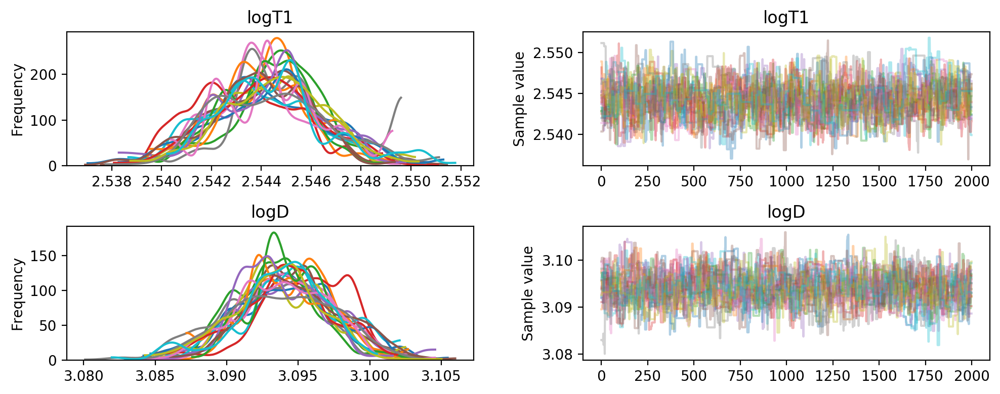

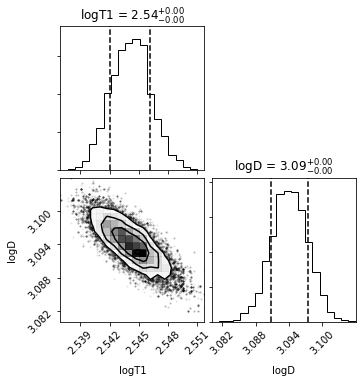

In [50]:
# Run FRM
model = FRM(verbose=False)
summary_frm, model_observations_frm, pymc_objs_frm = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with NEATM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD']
Emissivity Parameters: ['eps']
Emissivity Specification: None
Albedo Parameters: ['p']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [logT1]
>Metropolis: [logD]
The number of effective samples is smaller than 10% for some parameters.


Found best fit parameters:
 logT1: 2.571 +- 0.002
 logD:  3.093 +- 0.004
Total time: 27.73 seconds
Done.



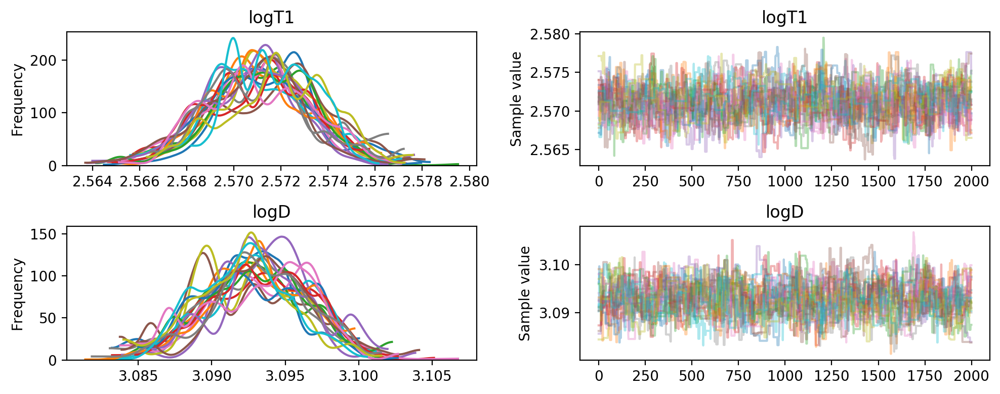

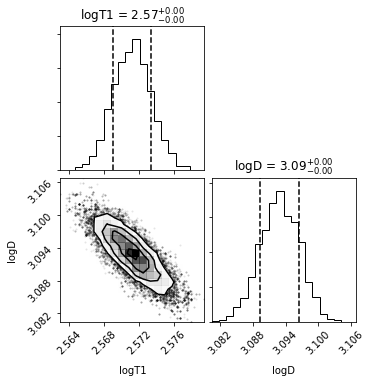

In [51]:
# Run NEATM
model = NEATM(verbose=False)
summary_neatm, model_observations_neatm, pymc_objs_neatm, figs = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    returnFigs=True,
    verbose=False)
if SAVE_FIGS is True:
    fig_corner = figs[1]
    fig_corner.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case3_NEATM_corner".format(FORMAT)), 
                       bbox_inches='tight',
                       dpi=DPI)

In [52]:
# Truth parameters
data[fitParameters]

,logT1,logD
0,2.625312,3.0
1,2.625312,3.0
2,2.625312,3.0
3,2.625312,3.0
4,2.625312,3.0
5,2.625312,3.0
6,2.625312,3.0
7,2.625312,3.0
8,2.625312,3.0
9,2.625312,3.0


In [53]:
# Fitting results
summary_stm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,STM,1,logT1,2.571169,0.002215,2.571164,0.002218,0.000086,746.192581,1.010221,2.567261,2.575954
1,0000,STM,1,logD,3.093056,0.003471,3.092997,0.003511,0.000140,707.993303,1.011862,3.085774,3.099785


In [54]:
# Fitting results
summary_frm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,FRM,1,logT1,2.544231,0.002044,2.544245,0.002110,0.000077,836.867086,1.009608,2.539971,2.548275
1,0000,FRM,1,logD,3.094022,0.003164,3.094040,0.003281,0.000120,851.642549,1.010512,3.087457,3.100337


In [55]:
# Fitting results
summary_neatm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,NEATM,1,logT1,2.571224,0.002220,2.571169,0.002183,0.000082,738.646514,1.010524,2.567046,2.575572
1,0000,NEATM,1,logD,3.092998,0.003627,3.092948,0.003490,0.000132,742.944881,1.009075,3.086245,3.099734


In [56]:
pred_D = 10**summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
pred_D_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logD"]["sigmaG"].values[0]) - pred_D
truth_D = 10**data["logD"].values[0]
percent_diff = (pred_D / truth_D - 1) * 100.
print("delta D [%]: {:.3f}".format(percent_diff))
print("pred D [m]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_D, 
                                                      pred_D_sigma, 
                                                      pred_D_sigma / pred_D * 100.))
print("")

pred_T1 = 10**summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
pred_T1_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logT1"]["sigmaG"].values[0]) - pred_T1
truth_T1 = 10**data["logT1"].values[0]
percent_diff = (pred_T1 / truth_T1 - 1) * 100.
print("delta T1 [%]: {:.3f}".format(percent_diff))
print("pred T1 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_T1, 
                                                       pred_T1_sigma, 
                                                       pred_T1_sigma / pred_T1 * 100.))

delta D [%]: 23.879
pred D [m]: 1238.791 +- 10.388 [0.839%]

delta T1 [%]: -11.710
pred T1 [K]: 372.584 +- 1.909 [0.512%]


In [57]:
# Use best-fit parameters to model fluxes
model = STM(verbose=False)

SED_stm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_stm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)   

# Use best-fit parameters to model fluxes
model = FRM(verbose=False)

SED_frm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_frm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)       

# Use best-fit parameters to model fluxes
model = NEATM(verbose=False)

SED_neatm_fit = calcFluxLambdaSED(model, obs, data,
                                  summary=summary_neatm,
                                  fitParameters=fitParameters,
                                  emissivitySpecification=emissivitySpecification,
                                  albedoSpecification=albedoSpecification,
                                  columnMapping=columnMapping,
                                  lambdaRange=lambdaRange,
                                  lambdaNum=lambdaNum,
                                  lambdaEdges=lambdaEdges,
                                  linearInterpolation=linearInterpolation)       


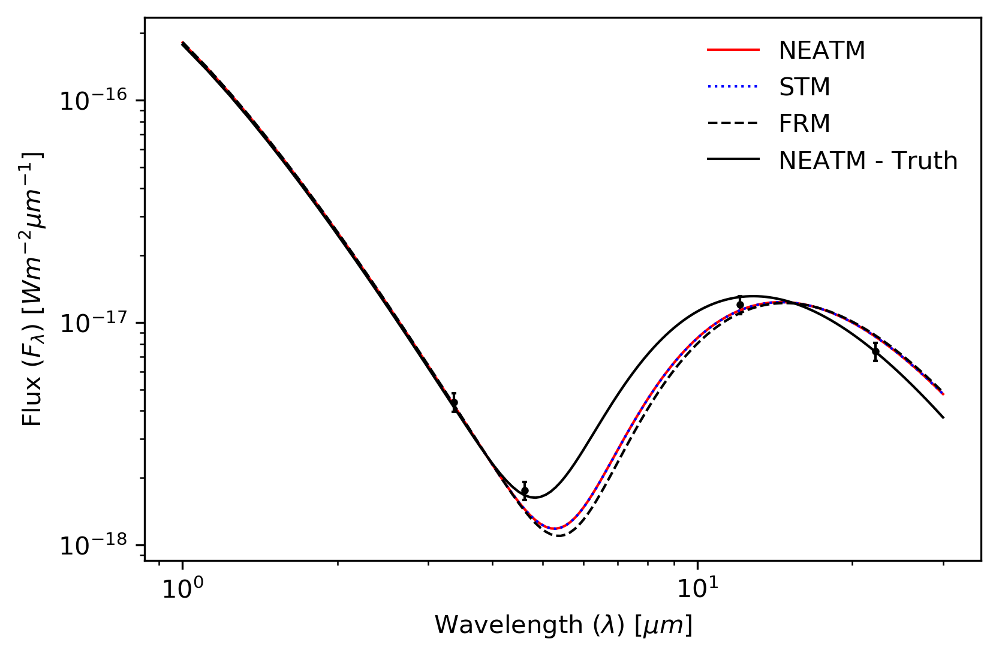

In [58]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm_fit, 
        ax=ax, 
        plotKwargs={"label": "NEATM", 
                    "c": "r", 
                    "lw": 1})
plotSED(SED_stm_fit, 
        ax=ax, 
        plotKwargs={"label": "STM", 
                    "c": "b", 
                    "ls": ":", 
                    "lw": 1})
plotSED(SED_frm_fit, 
        ax=ax, 
        plotKwargs={"label": "FRM", 
                    "c": "k", 
                    "ls": "--", 
                    "lw": 1})
plotSED(SED_neatm, 
        ax=ax, 
        plotKwargs={"label":"NEATM - Truth", 
                    "c" : "k" , 
                    "lw": 1})
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)
ax.legend(frameon=False)
if SAVE_FIGS is True:
    fig.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case3_SEDs".format(FORMAT)), 
                bbox_inches='tight',
                dpi=DPI)

### Case 4: 1 Observation 3 Parameters (Fit: $T_1$, $D$, $\epsilon_{W1W2}$; Assume: $\epsilon_{W3W4}$ = 0.7, $\Sigma$ = 0.2)

In [59]:
# Instantiate observatory and NEATM class for simulating data
obs = WISE()
model = NEATM(verbose=False)

In [60]:
# Load WISE quadrature lookup tables into memory 
model.loadLambdaTables(obs.filterQuadratureLambdas, verbose=False)

In [61]:
# Create observing geometry
num_obs = 1
r = np.random.normal(loc=3.0, scale=0.01, size=num_obs)
delta = r - 1.0
alpha = np.zeros(num_obs)

In [62]:
# Fractional flux error of 0.1% (will add 0.1 mag Sigma later)
err = 0.001

In [63]:
# Create fake asteroid
# Here we set a value of T1, we could also explicitly calculate T_ss 
#   using atm.functions.calcTss and from there calculate T1, however this is not needed 
#   for this example
G = 0.15 * np.ones(num_obs)
D = 1000 * np.ones(num_obs)
logD = np.log10(D) * np.ones(num_obs)
eps_W3W4 = np.array(0.70) * np.ones(num_obs)
eps_W1W2 = np.array(0.70) * np.ones(num_obs)
p_W1W2 = (1 - eps_W1W2) / calcQ(G)
p_W3W4 = (1 - eps_W3W4) / calcQ(G)
eps = eps_W1W2 # note that epsilon is the same in all bands
p = p_W1W2 # note that epsilon is the same in all bands
T1 = 422. * np.ones(num_obs)
logT1 = np.log10(T1)
T_ss = T1 / np.sqrt(r)

In [64]:
# Model flux with sunlight
flux = interpFluxLambdaObsWithSunlight(model, obs, r, delta, T_ss, D, alpha, eps, p, G).T
fluxErr = err * flux
mag = obs.convertFluxLambdaToMag(flux)
magErr = obs.convertFluxLambdaErrToMagErr(flux, fluxErr)

data = np.vstack([r, delta, alpha, G, D, logD, T1, logT1, T_ss,
                  flux[:, 0], flux[:, 1], flux[:, 2], flux[:, 3],
                  fluxErr[:, 0], fluxErr[:, 1], fluxErr[:, 2], fluxErr[:, 3],
                  mag[:, 0], mag[:, 1], mag[:, 2], mag[:, 3],
                  magErr[:, 0], magErr[:, 1], magErr[:, 2], magErr[:, 3]])

data = pd.DataFrame(data.T, columns=["r",
                                     "delta",
                                     "alpha",
                                     "G",
                                     "D",
                                     "logD",
                                     "T1",
                                     "logT1",
                                     "T_ss",
                                     "flux_W1_si",
                                     "flux_W2_si",
                                     "flux_W3_si",
                                     "flux_W4_si",
                                     "fluxErr_W1_si",
                                     "fluxErr_W2_si",
                                     "fluxErr_W3_si",
                                     "fluxErr_W4_si",
                                     "mag_W1",
                                     "mag_W2",
                                     "mag_W3",
                                     "mag_W4",
                                     "magErr_W1",
                                     "magErr_W2",
                                     "magErr_W3",
                                     "magErr_W4"])
data["obs_id"] = np.arange(1, len(data) + 1)
data["eps_W3W4"] = eps_W3W4
data["eps_W1W2"] = eps_W1W2
data["p_W1W2"] = p_W1W2
data["p_W3W4"] = p_W3W4
data["designation"] = ["0000" for i in range(len(data))]
data = data[["obs_id", "designation", "r", "delta", "alpha", "G", "D", "logD", "T1", "logT1", "T_ss", 
             "eps_W1W2", "eps_W3W4", "p_W1W2", "p_W3W4",
             "flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si", 
             "fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si",
             "mag_W1", "mag_W2", "mag_W3", "mag_W4",
             "magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]]

In [65]:
columnMapping = {
    "designation" : "designation",
    "obs_id" : "obs_id",
    "r_au" : "r",
    "delta_au" : "delta",
    "alpha_rad" : "alpha",
    "G" : "G",
    "logT1" : "logT1",
    "logD": "logD",
    "eps" : ["eps_W1W2", "eps_W3W4"],
    "p" : ["p_W1W2", "p_W3W4"],
    "flux_si": ["flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si"],
    "fluxErr_si": ["fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si"],
    "mag" : ["mag_W1", "mag_W2", "mag_W3", "mag_W4"],
    "magErr" : ["magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]
}
fitParameters = ["logT1", "logD", "eps_W1W2"]
fitFilters = "all"
emissivitySpecification = {"eps_W1W2" : ["W1", "W2"],
                           "eps_W3W4" : ["W3", "W4"]}
albedoSpecification = "auto"

# Wavelength config for calculating SEDs
lambdaRange=[1e-6, 30e-6]
lambdaNum=250
lambdaEdges=[3.9e-6, 6.5e-6, 18.5e-6]
linearInterpolation=False

In [66]:
# Modify errors: add sigma of 0.1 mag to account for rotation (assumed better observed than Case 1 and 2)
data = modifyErrors(data, obs, sigma=0.2, columnMapping=columnMapping)

Added 0.2 magnitude errors to magErr_W1.
Added 0.2 magnitude errors to magErr_W2.
Added 0.2 magnitude errors to magErr_W3.
Added 0.2 magnitude errors to magErr_W4.
Converted magnitude errors to flux errors.
Updating fluxErr_W1_si with new error.
Updating fluxErr_W2_si with new error.
Updating fluxErr_W3_si with new error.
Updating fluxErr_W4_si with new error.
Done.



In [67]:
data

,obs_id,designation,r,delta,alpha,G,D,logD,T1,logT1,...,fluxErr_W3_si,fluxErr_W4_si,mag_W1,mag_W2,mag_W3,mag_W4,magErr_W1,magErr_W2,magErr_W3,magErr_W4
0,1,0000,2.989715,1.989715,0.0,0.15,1000.0,3.0,422.0,2.625312,...,2.272400e-12,1.391661e-12,18.148489,17.815912,11.800519,9.522442,0.201086,0.201086,0.201086,0.201086


In [68]:
# Generate truth at a variety of wavelengths for plotting
model = NEATM(verbose=False)

SED_neatm = calcFluxLambdaSED(model, obs, data,
                              emissivitySpecification=emissivitySpecification,
                              albedoSpecification=albedoSpecification,
                              columnMapping=columnMapping,
                              lambdaRange=lambdaRange,
                              lambdaNum=lambdaNum,
                              lambdaEdges=lambdaEdges,
                              linearInterpolation=linearInterpolation)   

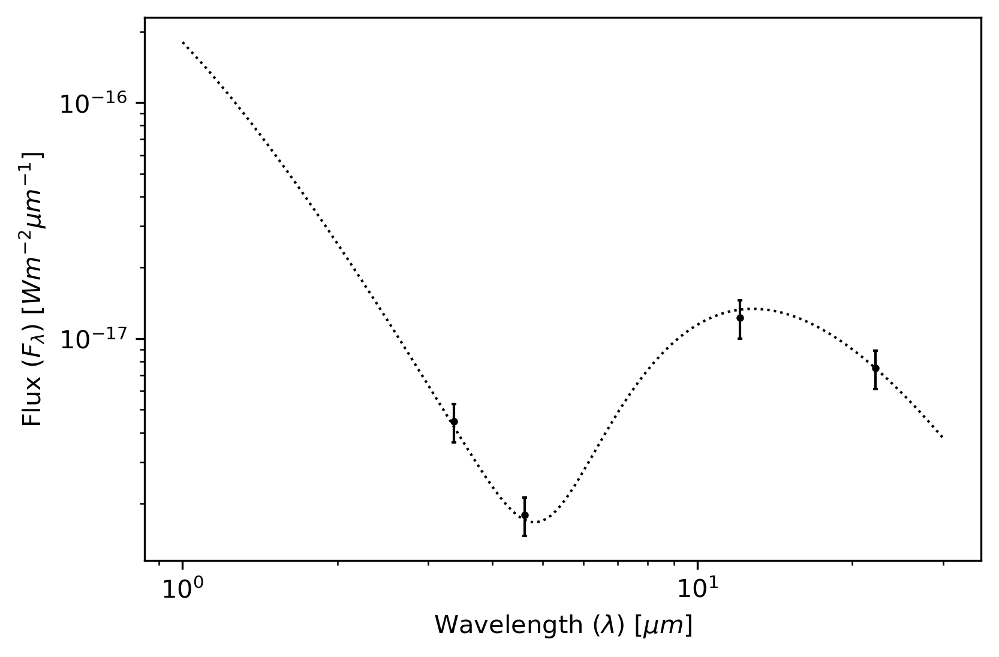

In [69]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm, ax=ax)
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)

Fitting 0000 with STM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD', 'eps_W1W2']
Emissivity Parameters: ['eps_W1W2' 'eps_W3W4']
Emissivity Specification: {'eps_W1W2': ['W1', 'W2'], 'eps_W3W4': ['W3', 'W4']}
Albedo Parameters: ['p_W1W2' 'p_W3W4']
Albedo Specification: auto
Number of observations: 1
Ignoring data parameters: ['logD', 'logT1', 'eps_W1W2']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [eps_W1W2]
>Metropolis: [logT1]
>Metropolis: [logD]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


Found best fit parameters:
 logT1:    2.652 +- 0.052
 logD:     2.927 +- 0.124
 eps_W1W2: 0.595 +- 0.246
Total time: 42.14 seconds
Done.



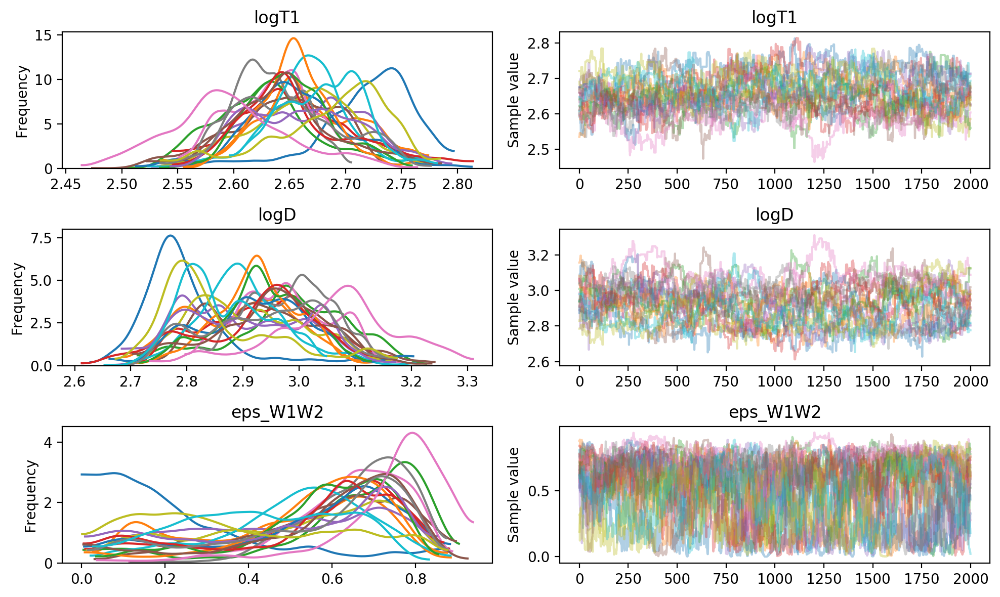

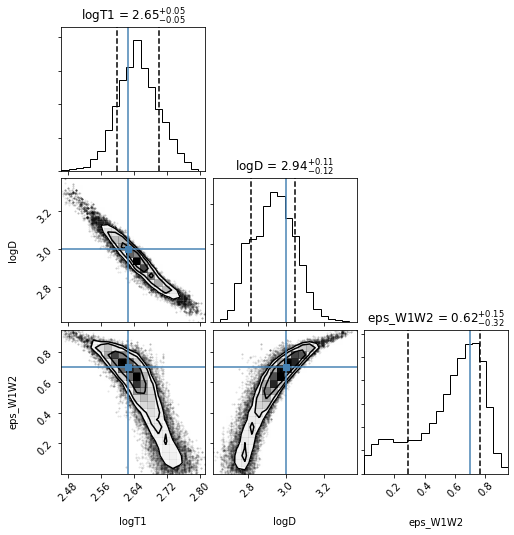

In [70]:
# Run STM
model = STM(verbose=False)
summary_stm, model_observations_stm, pymc_objs_stm = fit(
    model, 
    obs, 
    data,
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with FRM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD', 'eps_W1W2']
Emissivity Parameters: ['eps_W1W2' 'eps_W3W4']
Emissivity Specification: {'eps_W1W2': ['W1', 'W2'], 'eps_W3W4': ['W3', 'W4']}
Albedo Parameters: ['p_W1W2' 'p_W3W4']
Albedo Specification: auto
Number of observations: 1
Ignoring data parameters: ['logD', 'logT1', 'eps_W1W2']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [eps_W1W2]
>Metropolis: [logT1]
>Metropolis: [logD]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


Found best fit parameters:
 logT1:    2.629 +- 0.052
 logD:     2.929 +- 0.119
 eps_W1W2: 0.597 +- 0.229
Total time: 42.61 seconds
Done.



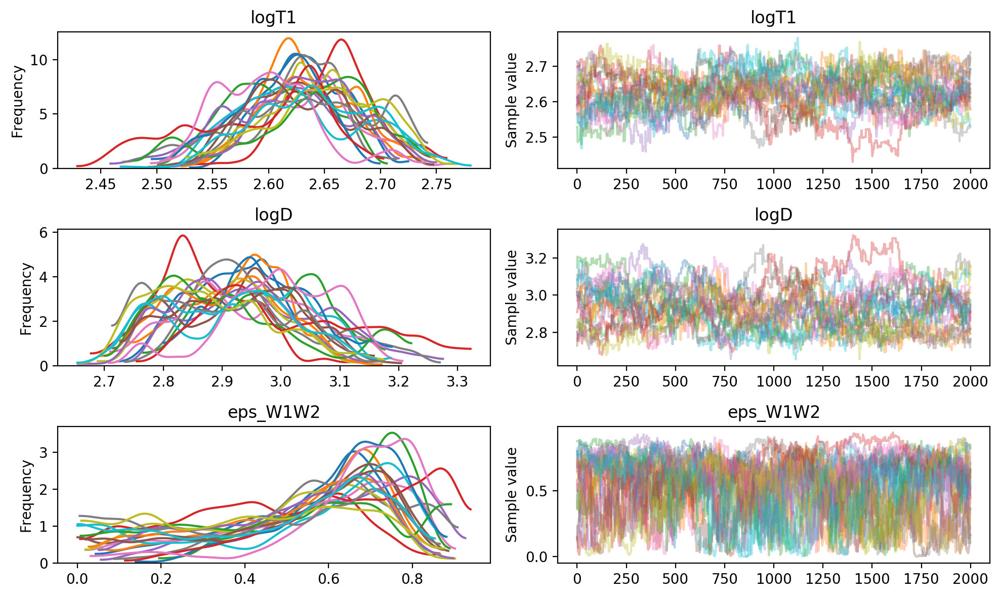

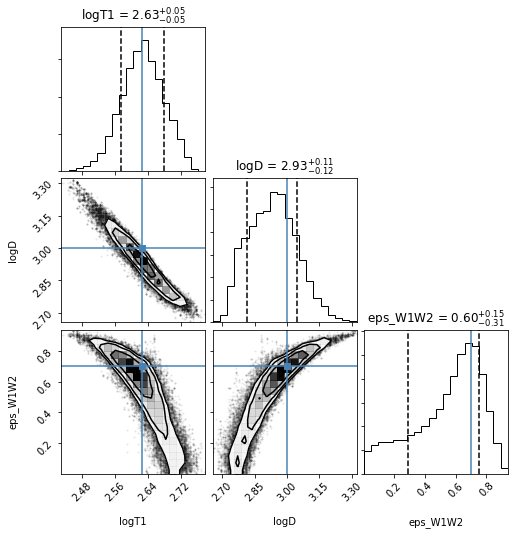

In [71]:
# Run FRM
model = FRM(verbose=False)
summary_frm, model_observations_frm, pymc_objs_frm = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with NEATM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD', 'eps_W1W2']
Emissivity Parameters: ['eps_W1W2' 'eps_W3W4']
Emissivity Specification: {'eps_W1W2': ['W1', 'W2'], 'eps_W3W4': ['W3', 'W4']}
Albedo Parameters: ['p_W1W2' 'p_W3W4']
Albedo Specification: auto
Number of observations: 1
Ignoring data parameters: ['logD', 'logT1', 'eps_W1W2']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [eps_W1W2]
>Metropolis: [logT1]
>Metropolis: [logD]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


Found best fit parameters:
 logT1:    2.653 +- 0.051
 logD:     2.927 +- 0.118
 eps_W1W2: 0.597 +- 0.232
Total time: 40.42 seconds
Done.



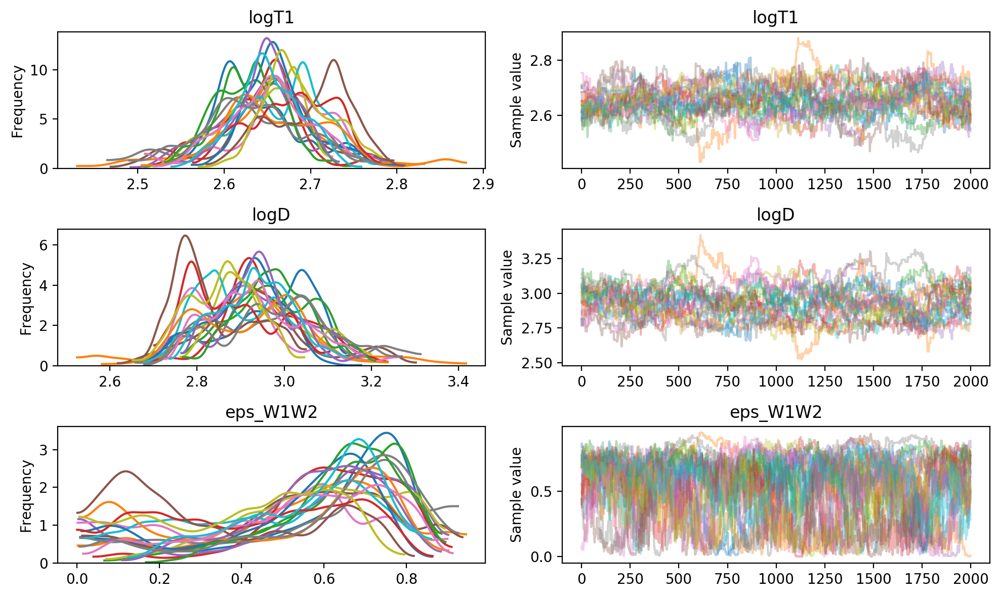

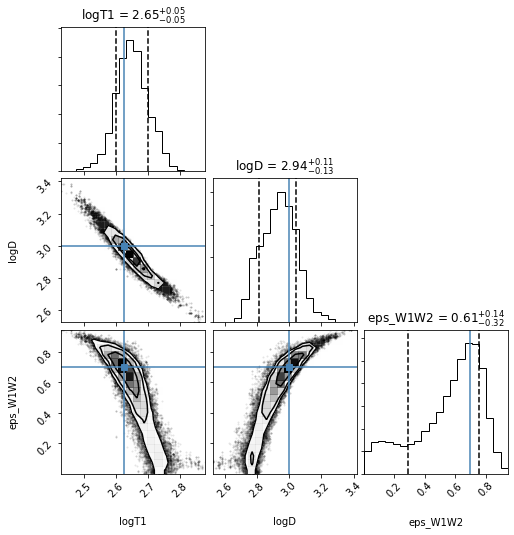

In [72]:
# Run NEATM
model = NEATM(verbose=False)
summary_neatm, model_observations_neatm, pymc_objs_neatm, figs = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    returnFigs=True,
    verbose=False)
if SAVE_FIGS is True:
    fig_corner = figs[1]
    fig_corner.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case4_NEATM_corner".format(FORMAT)), 
                       bbox_inches='tight',
                       dpi=DPI)

In [73]:
# Truth parameters
data[fitParameters]

,logT1,logD,eps_W1W2
0,2.625312,3.0,0.7


In [74]:
# Fitting results
summary_stm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,STM,1,logT1,2.652336,0.052312,2.654731,0.051376,0.003762,100.804915,1.103700,2.564365,2.763263
1,0000,STM,1,logD,2.926909,0.124361,2.925211,0.110472,0.008182,98.514332,1.106035,2.734085,3.136233
2,0000,STM,1,eps_W1W2,0.595104,0.246476,0.534771,0.227333,0.016422,115.104033,1.087189,0.060111,0.841721


In [75]:
# Fitting results
summary_frm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,FRM,1,logT1,2.628694,0.051840,2.627204,0.051765,0.003767,138.167630,1.059569,2.534190,2.732257
1,0000,FRM,1,logD,2.929135,0.118888,2.931060,0.110945,0.008153,135.747758,1.061901,2.728455,3.136154
2,0000,FRM,1,eps_W1W2,0.596802,0.228822,0.544249,0.217886,0.015095,154.656779,1.050522,0.093300,0.876334


In [76]:
# Fitting results
summary_neatm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,NEATM,1,logT1,2.653352,0.051448,2.653259,0.053623,0.003945,160.480707,1.055587,2.553116,2.764893
1,0000,NEATM,1,logD,2.927308,0.118220,2.928311,0.114769,0.008522,159.405100,1.053937,2.715870,3.140890
2,0000,NEATM,1,eps_W1W2,0.596877,0.232483,0.538983,0.226520,0.016140,163.006307,1.054117,0.046145,0.851490


In [77]:
pred_D = 10**summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
pred_D_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logD"]["sigmaG"].values[0]) - pred_D
truth_D = 10**data["logD"].values[0]
percent_diff = (pred_D / truth_D - 1) * 100.
print("delta D [%]: {:.3f}".format(percent_diff))
print("pred D [m]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_D, 
                                                      pred_D_sigma, 
                                                      pred_D_sigma / pred_D * 100.))
print("")

pred_T1 = 10**summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
pred_T1_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logT1"]["sigmaG"].values[0]) - pred_T1
truth_T1 = 10**data["logT1"].values[0]
percent_diff = (pred_T1 / truth_T1 - 1) * 100.
print("delta T1 [%]: {:.3f}".format(percent_diff))
print("pred T1 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_T1, 
                                                       pred_T1_sigma, 
                                                       pred_T1_sigma / pred_T1 * 100.))
print("")

pred_epsW1W2 = summary_neatm[summary_neatm["parameter"] == "eps_W1W2"]["median"].values[0] 
pred_epsW1W2_sigma = (summary_neatm[summary_neatm["parameter"] == "eps_W1W2"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "eps_W1W2"]["sigmaG"].values[0]) - pred_epsW1W2
truth_epsW1W2 = data["eps_W1W2"].values[0]
percent_diff = (pred_epsW1W2 / truth_epsW1W2 - 1) * 100.
print("delta eps_W1W2 [%]: {:.3f}".format(percent_diff))
print("pred eps_W1W2 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_epsW1W2, 
                                                       pred_epsW1W2_sigma, 
                                                       pred_epsW1W2_sigma / pred_epsW1W2 * 100.))

delta D [%]: -15.412
pred D [m]: 845.879 +- 264.646 [31.287%]

delta T1 [%]: 6.669
pred T1 [K]: 450.144 +- 56.613 [12.577%]

delta eps_W1W2 [%]: -14.732
pred eps_W1W2 [K]: 0.597 +- 0.232 [38.950%]


In [78]:
# Use best-fit parameters to model fluxes
model = STM(verbose=False)

SED_stm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_stm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)   

# Use best-fit parameters to model fluxes
model = FRM(verbose=False)

SED_frm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_frm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)       

# Use best-fit parameters to model fluxes
model = NEATM(verbose=False)

SED_neatm_fit = calcFluxLambdaSED(model, obs, data,
                                  summary=summary_neatm,
                                  fitParameters=fitParameters,
                                  emissivitySpecification=emissivitySpecification,
                                  albedoSpecification=albedoSpecification,
                                  columnMapping=columnMapping,
                                  lambdaRange=lambdaRange,
                                  lambdaNum=lambdaNum,
                                  lambdaEdges=lambdaEdges,
                                  linearInterpolation=linearInterpolation)       


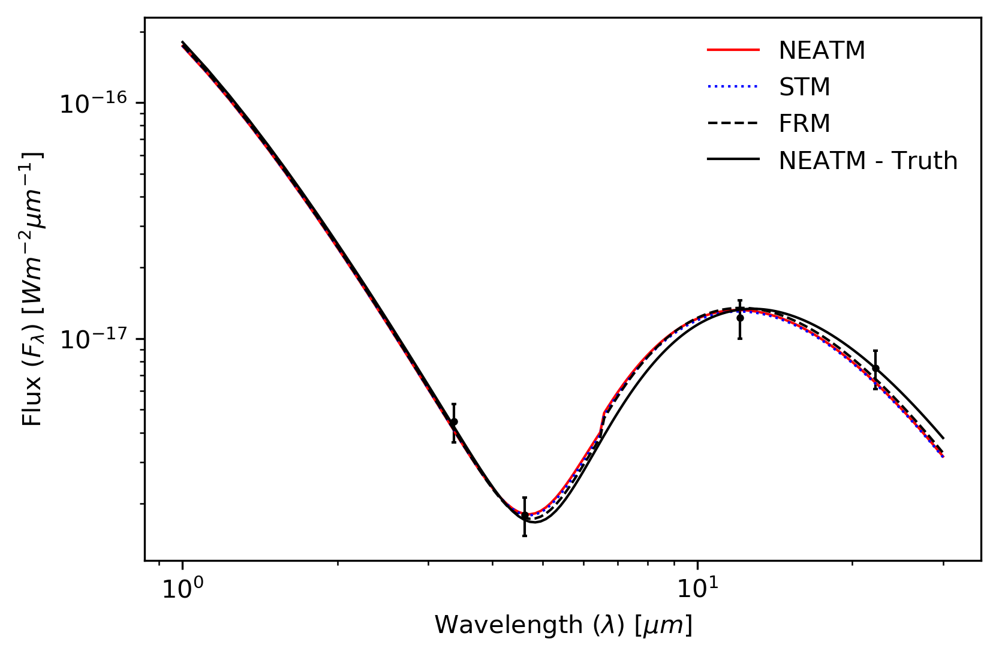

In [79]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm_fit, 
        ax=ax, 
        plotKwargs={"label": "NEATM", 
                    "c": "r", 
                    "lw": 1})
plotSED(SED_stm_fit, 
        ax=ax, 
        plotKwargs={"label": "STM", 
                    "c": "b", 
                    "ls": ":", 
                    "lw": 1})
plotSED(SED_frm_fit, 
        ax=ax, 
        plotKwargs={"label": "FRM", 
                    "c": "k", 
                    "ls": "--", 
                    "lw": 1})
plotSED(SED_neatm, 
        ax=ax, 
        plotKwargs={"label":"NEATM - Truth", 
                    "c" : "k" , 
                    "lw": 1})
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)
ax.legend(frameon=False)
if SAVE_FIGS is True:
    fig.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case4_SEDs".format(FORMAT)), 
                bbox_inches='tight',
                dpi=DPI)

### Case 5: 25 Observations 3 Parameters (Fit: $T_1$, $D$, $\epsilon_{W1W2}$; Assume: $\epsilon_{W3W4}$ = 0.7, $\Sigma$ = 0.1)

In [80]:
# Instantiate observatory and NEATM class for simulating data
obs = WISE()
model = NEATM(verbose=False)

In [81]:
# Load WISE quadrature lookup tables into memory 
model.loadLambdaTables(obs.filterQuadratureLambdas, verbose=False)

In [82]:
# Create observing geometry
num_obs = 25
r = np.random.normal(loc=3.0, scale=0.01, size=num_obs)
delta = r - 1.0
alpha = np.zeros(num_obs)

In [83]:
# Fractional flux error of 0.1% (will add 0.1 mag Sigma later)
err = 0.001

In [84]:
# Create fake asteroid
# Here we set a value of T1, we could also explicitly calculate T_ss 
#   using atm.functions.calcTss and from there calculate T1, however this is not needed 
#   for this example
G = 0.15 * np.ones(num_obs)
D = 1000 * np.ones(num_obs)
logD = np.log10(D) * np.ones(num_obs)
eps_W3W4 = np.array(0.70) * np.ones(num_obs)
eps_W1W2 = np.array(0.70) * np.ones(num_obs)
p_W1W2 = (1 - eps_W1W2) / calcQ(G)
p_W3W4 = (1 - eps_W3W4) / calcQ(G)
eps = eps_W1W2 # note that epsilon is the same in all bands
p = p_W1W2 # note that epsilon is the same in all bands
T1 = 422. * np.ones(num_obs)
logT1 = np.log10(T1)
T_ss = T1 / np.sqrt(r)

In [85]:
# Model flux with sunlight
flux = interpFluxLambdaObsWithSunlight(model, obs, r, delta, T_ss, D, alpha, eps, p, G).T
fluxErr = err * flux
mag = obs.convertFluxLambdaToMag(flux)
magErr = obs.convertFluxLambdaErrToMagErr(flux, fluxErr)

data = np.vstack([r, delta, alpha, G, D, logD, T1, logT1, T_ss,
                  flux[:, 0], flux[:, 1], flux[:, 2], flux[:, 3],
                  fluxErr[:, 0], fluxErr[:, 1], fluxErr[:, 2], fluxErr[:, 3],
                  mag[:, 0], mag[:, 1], mag[:, 2], mag[:, 3],
                  magErr[:, 0], magErr[:, 1], magErr[:, 2], magErr[:, 3]])

data = pd.DataFrame(data.T, columns=["r",
                                     "delta",
                                     "alpha",
                                     "G",
                                     "D",
                                     "logD",
                                     "T1",
                                     "logT1",
                                     "T_ss",
                                     "flux_W1_si",
                                     "flux_W2_si",
                                     "flux_W3_si",
                                     "flux_W4_si",
                                     "fluxErr_W1_si",
                                     "fluxErr_W2_si",
                                     "fluxErr_W3_si",
                                     "fluxErr_W4_si",
                                     "mag_W1",
                                     "mag_W2",
                                     "mag_W3",
                                     "mag_W4",
                                     "magErr_W1",
                                     "magErr_W2",
                                     "magErr_W3",
                                     "magErr_W4"])
data["obs_id"] = np.arange(1, len(data) + 1)
data["eps_W3W4"] = eps_W3W4
data["eps_W1W2"] = eps_W1W2
data["p_W1W2"] = p_W1W2
data["p_W3W4"] = p_W3W4
data["designation"] = ["0000" for i in range(len(data))]
data = data[["obs_id", "designation", "r", "delta", "alpha", "G", "D", "logD", "T1", "logT1", "T_ss", 
             "eps_W1W2", "eps_W3W4", "p_W1W2", "p_W3W4",
             "flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si", 
             "fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si",
             "mag_W1", "mag_W2", "mag_W3", "mag_W4",
             "magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]]

In [86]:
columnMapping = {
    "designation" : "designation",
    "obs_id" : "obs_id",
    "r_au" : "r",
    "delta_au" : "delta",
    "alpha_rad" : "alpha",
    "G" : "G",
    "logT1" : "logT1",
    "logD": "logD",
    "eps" : ["eps_W1W2", "eps_W3W4"],
    "p" : ["p_W1W2", "p_W3W4"],
    "flux_si": ["flux_W1_si", "flux_W2_si", "flux_W3_si", "flux_W4_si"],
    "fluxErr_si": ["fluxErr_W1_si", "fluxErr_W2_si", "fluxErr_W3_si", "fluxErr_W4_si"],
    "mag" : ["mag_W1", "mag_W2", "mag_W3", "mag_W4"],
    "magErr" : ["magErr_W1", "magErr_W2", "magErr_W3", "magErr_W4"]
}
fitParameters = ["logT1", "logD", "eps_W1W2"]
fitFilters = "all"
emissivitySpecification = {"eps_W1W2" : ["W1", "W2"],
                           "eps_W3W4" : ["W3", "W4"]}
albedoSpecification = "auto"

# Wavelength config for calculating SEDs
lambdaRange=[1e-6, 30e-6]
lambdaNum=250
lambdaEdges=[3.9e-6, 6.5e-6, 18.5e-6]
linearInterpolation=False

In [87]:
# Modify errors: add sigma of 0.1 mag to account for rotation (assumed better observed than Case 1 and 2)
data = modifyErrors(data, obs, sigma=0.1, columnMapping=columnMapping)

Added 0.1 magnitude errors to magErr_W1.
Added 0.1 magnitude errors to magErr_W2.
Added 0.1 magnitude errors to magErr_W3.
Added 0.1 magnitude errors to magErr_W4.
Converted magnitude errors to flux errors.
Updating fluxErr_W1_si with new error.
Updating fluxErr_W2_si with new error.
Updating fluxErr_W3_si with new error.
Updating fluxErr_W4_si with new error.
Done.



In [88]:
data

,obs_id,designation,r,delta,alpha,G,D,logD,T1,logT1,...,fluxErr_W3_si,fluxErr_W4_si,mag_W1,mag_W2,mag_W3,mag_W4,magErr_W1,magErr_W2,magErr_W3,magErr_W4
0,1,0000,2.990595,1.990595,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.140466e-12,6.986471e-13,18.150097,17.817839,11.802297,9.523902,0.101086,0.101086,0.101086,0.101086
1,2,0000,3.016118,2.016118,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.087854e-12,6.720704e-13,18.196457,17.873277,11.853576,9.566010,0.101086,0.101086,0.101086,0.101086
2,3,0000,2.987639,1.987639,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.146754e-12,7.018100e-13,18.144694,17.811366,11.796327,9.518998,0.101086,0.101086,0.101086,0.101086
3,4,0000,2.999768,1.999768,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.121213e-12,6.889452e-13,18.166820,17.837858,11.820782,9.539085,0.101086,0.101086,0.101086,0.101086
4,5,0000,2.983024,1.983024,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.156654e-12,7.067847e-13,18.136244,17.801237,11.786993,9.511329,0.101086,0.101086,0.101086,0.101086
5,6,0000,3.006890,2.006890,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.106534e-12,6.815301e-13,18.179755,17.853326,11.835090,9.550834,0.101086,0.101086,0.101086,0.101086
6,7,0000,2.995205,1.995205,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.130741e-12,6.937501e-13,18.158510,17.827913,11.811594,9.531539,0.101086,0.101086,0.101086,0.101086
7,8,0000,3.002953,2.002953,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.114620e-12,6.856168e-13,18.172609,17.844783,11.827185,9.544343,0.101086,0.101086,0.101086,0.101086
8,9,0000,2.983860,1.983860,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.154853e-12,7.058799e-13,18.137777,17.803075,11.788686,9.512720,0.101086,0.101086,0.101086,0.101086
9,10,0000,3.009496,2.009496,0.0,0.15,1000.0,3.0,422.0,2.625312,...,1.101221e-12,6.788420e-13,18.184478,17.858970,11.840316,9.555125,0.101086,0.101086,0.101086,0.101086


In [89]:
# Generate truth at a variety of wavelengths for plotting
model = NEATM(verbose=False)

SED_neatm = calcFluxLambdaSED(model, obs, data,
                              emissivitySpecification=emissivitySpecification,
                              albedoSpecification=albedoSpecification,
                              columnMapping=columnMapping,
                              lambdaRange=lambdaRange,
                              lambdaNum=lambdaNum,
                              lambdaEdges=lambdaEdges,
                              linearInterpolation=linearInterpolation)   

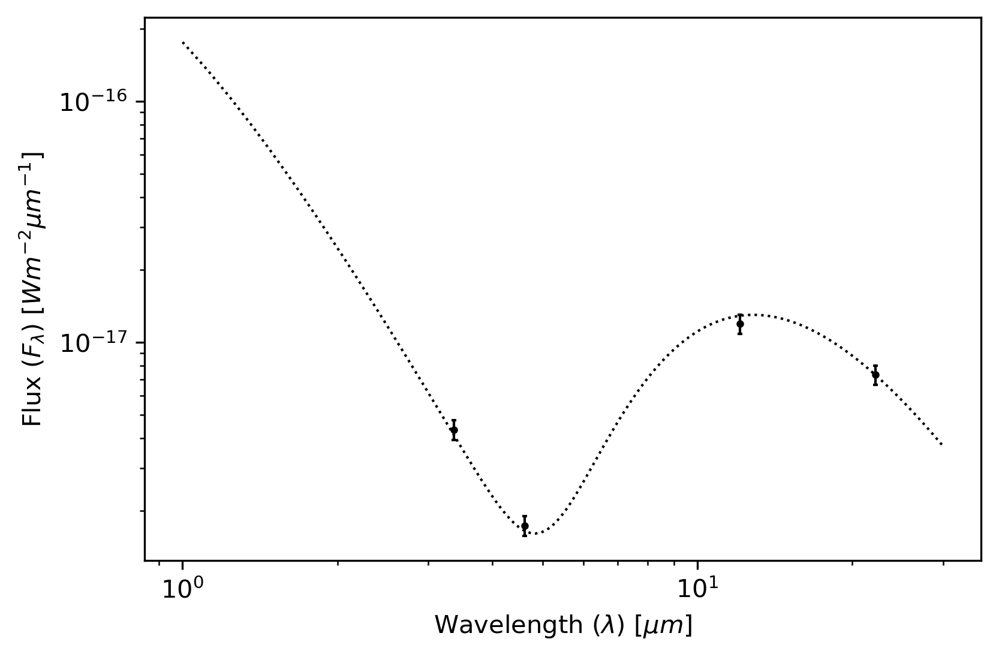

In [90]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm, ax=ax)
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)

Fitting 0000 with STM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD', 'eps_W1W2']
Emissivity Parameters: ['eps_W1W2' 'eps_W3W4']
Emissivity Specification: {'eps_W1W2': ['W1', 'W2'], 'eps_W3W4': ['W3', 'W4']}
Albedo Parameters: ['p_W1W2' 'p_W3W4']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1', 'eps_W1W2']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [eps_W1W2]
>Metropolis: [logT1]
>Metropolis: [logD]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


Found best fit parameters:
 logT1:    2.626 +- 0.004
 logD:     2.999 +- 0.010
 eps_W1W2: 0.699 +- 0.013
Total time: 44.28 seconds
Done.



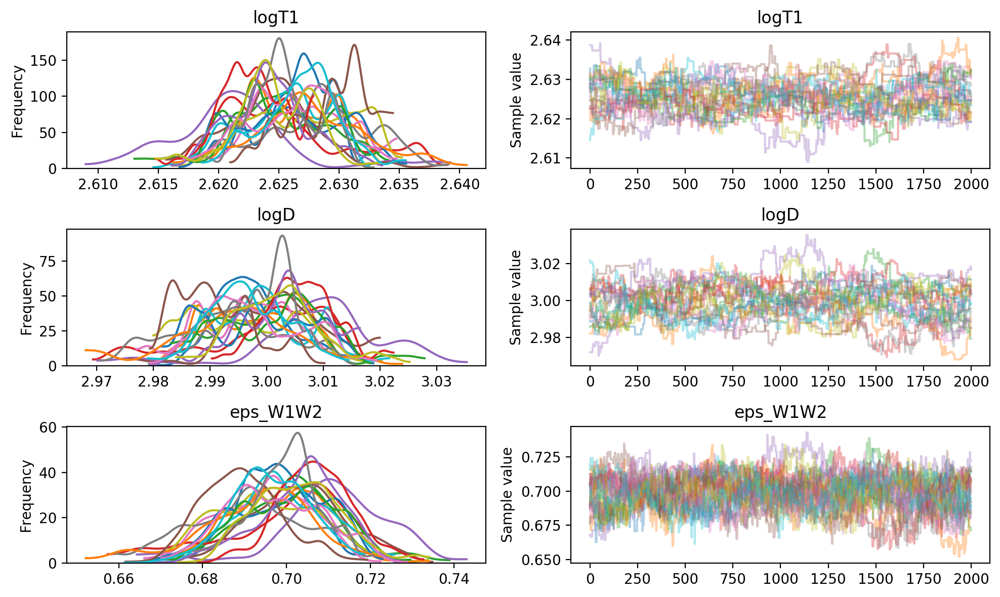

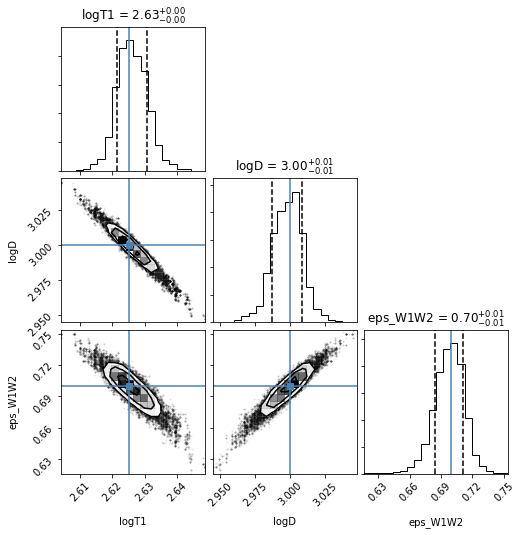

In [91]:
# Run STM
model = STM(verbose=False)
summary_stm, model_observations_stm, pymc_objs_stm = fit(
    model, 
    obs, 
    data,
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with FRM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD', 'eps_W1W2']
Emissivity Parameters: ['eps_W1W2' 'eps_W3W4']
Emissivity Specification: {'eps_W1W2': ['W1', 'W2'], 'eps_W3W4': ['W3', 'W4']}
Albedo Parameters: ['p_W1W2' 'p_W3W4']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1', 'eps_W1W2']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [eps_W1W2]
>Metropolis: [logT1]
>Metropolis: [logD]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


Found best fit parameters:
 logT1:    2.609 +- 0.004
 logD:     2.980 +- 0.009
 eps_W1W2: 0.669 +- 0.014
Total time: 40.03 seconds
Done.



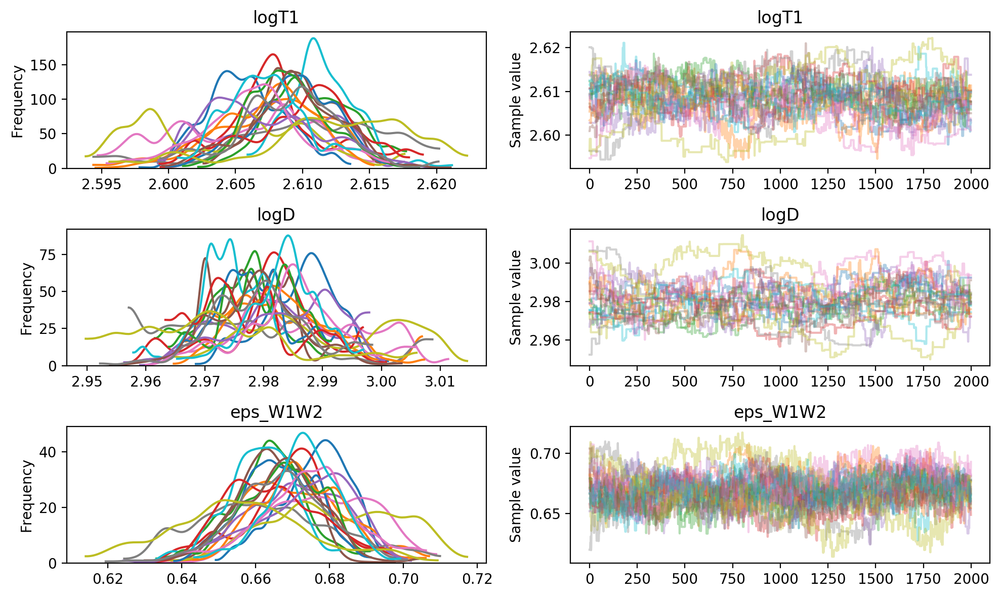

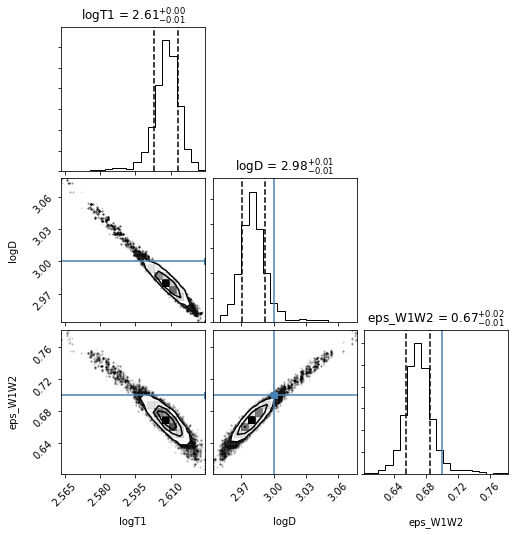

In [92]:
# Run FRM
model = FRM(verbose=False)
summary_frm, model_observations_frm, pymc_objs_frm = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    verbose=False)

Fitting 0000 with NEATM...
Fit Code: 1
Fit Parameters: ['logT1', 'logD', 'eps_W1W2']
Emissivity Parameters: ['eps_W1W2' 'eps_W3W4']
Emissivity Specification: {'eps_W1W2': ['W1', 'W2'], 'eps_W3W4': ['W3', 'W4']}
Albedo Parameters: ['p_W1W2' 'p_W3W4']
Albedo Specification: auto
Number of observations: 25
Ignoring data parameters: ['logD', 'logT1', 'eps_W1W2']
Chains: 20
Samples per Chain: 3000
Burn-in Samples: 500
Effective Samples per Chain: 2500
Threads: 10


Multiprocess sampling (20 chains in 10 jobs)
CompoundStep
>Metropolis: [eps_W1W2]
>Metropolis: [logT1]
>Metropolis: [logD]
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


Found best fit parameters:
 logT1:    2.625 +- 0.004
 logD:     3.001 +- 0.009
 eps_W1W2: 0.701 +- 0.011
Total time: 39.17 seconds
Done.



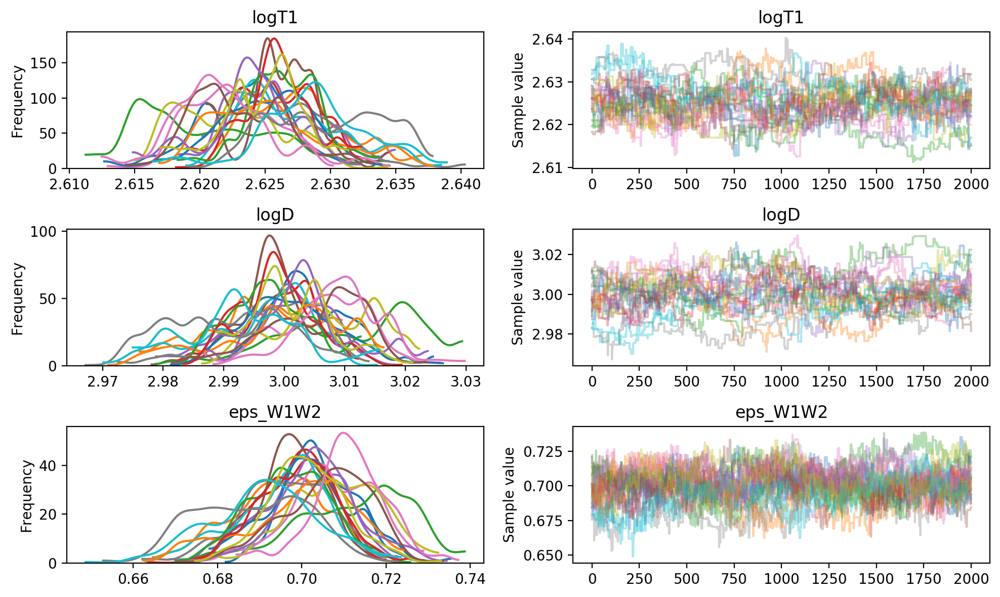

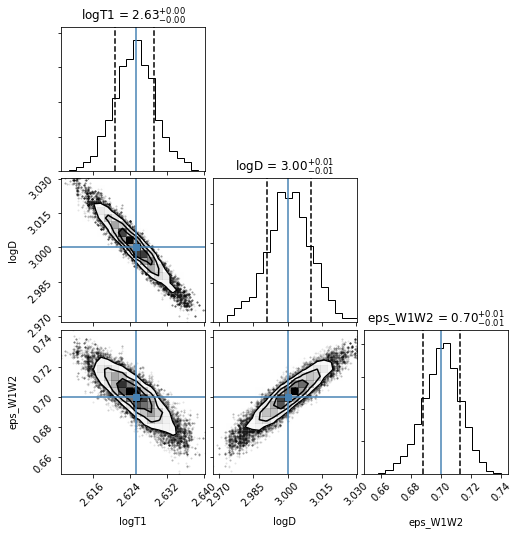

In [93]:
# Run NEATM
model = NEATM(verbose=False)
summary_neatm, model_observations_neatm, pymc_objs_neatm, figs = fit(
    model, 
    obs, 
    data, 
    fitParameters=fitParameters, 
    fitFilters=fitFilters,
    emissivitySpecification=emissivitySpecification, 
    albedoSpecification=albedoSpecification,
    columnMapping=columnMapping,
    returnFigs=True,
    verbose=False)
if SAVE_FIGS is True:
    fig_corner = figs[1]
    fig_corner.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case5_NEATM_corner".format(FORMAT)), 
                       bbox_inches='tight',
                       dpi=DPI)

In [94]:
# Truth parameters
data[fitParameters]

,logT1,logD,eps_W1W2
0,2.625312,3.0,0.7
1,2.625312,3.0,0.7
2,2.625312,3.0,0.7
3,2.625312,3.0,0.7
4,2.625312,3.0,0.7
5,2.625312,3.0,0.7
6,2.625312,3.0,0.7
7,2.625312,3.0,0.7
8,2.625312,3.0,0.7
9,2.625312,3.0,0.7


In [95]:
# Fitting results
summary_stm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,STM,1,logT1,2.625579,0.004477,2.625692,0.004273,0.000322,94.927406,1.080526,2.617987,2.633968
1,0000,STM,1,logD,2.999392,0.010018,2.999082,0.009610,0.000735,91.839607,1.084199,2.980498,3.016509
2,0000,STM,1,eps_W1W2,0.699280,0.012569,0.698700,0.012407,0.000875,102.512133,1.072795,0.674809,0.722596


In [96]:
# Fitting results
summary_frm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,FRM,1,logT1,2.608521,0.004195,2.608341,0.004517,0.000346,77.688348,1.122511,2.599062,2.617594
1,0000,FRM,1,logD,2.980213,0.009346,2.980418,0.009959,0.000780,75.886223,1.124671,2.960056,3.001541
2,0000,FRM,1,eps_W1W2,0.668856,0.013613,0.668744,0.014116,0.001027,82.205638,1.113911,0.640661,0.697115


In [97]:
# Fitting results
summary_neatm

,designation,model,code,parameter,median,sigmaG,mean,sd,mc_error,n_eff,Rhat,hpd_2.5,hpd_97.5
0,0000,NEATM,1,logT1,2.625083,0.004162,2.625093,0.004340,0.000335,76.239357,1.128484,2.616925,2.634360
1,0000,NEATM,1,logD,3.000613,0.008844,3.000444,0.009583,0.000756,73.703889,1.132809,2.980319,3.019540
2,0000,NEATM,1,eps_W1W2,0.701043,0.011451,0.700462,0.012180,0.000892,85.405552,1.113332,0.675923,0.724275


In [98]:
pred_D = 10**summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
pred_D_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logD"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logD"]["sigmaG"].values[0]) - pred_D
truth_D = 10**data["logD"].values[0]
percent_diff = (pred_D / truth_D - 1) * 100.
print("delta D [%]: {:.3f}".format(percent_diff))
print("pred D [m]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_D, 
                                                      pred_D_sigma, 
                                                      pred_D_sigma / pred_D * 100.))
print("")

pred_T1 = 10**summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
pred_T1_sigma = 10**(summary_neatm[summary_neatm["parameter"] == "logT1"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "logT1"]["sigmaG"].values[0]) - pred_T1
truth_T1 = 10**data["logT1"].values[0]
percent_diff = (pred_T1 / truth_T1 - 1) * 100.
print("delta T1 [%]: {:.3f}".format(percent_diff))
print("pred T1 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_T1, 
                                                       pred_T1_sigma, 
                                                       pred_T1_sigma / pred_T1 * 100.))
print("")

pred_epsW1W2 = summary_neatm[summary_neatm["parameter"] == "eps_W1W2"]["median"].values[0] 
pred_epsW1W2_sigma = (summary_neatm[summary_neatm["parameter"] == "eps_W1W2"]["median"].values[0] 
                    +summary_neatm[summary_neatm["parameter"] == "eps_W1W2"]["sigmaG"].values[0]) - pred_epsW1W2
truth_epsW1W2 = data["eps_W1W2"].values[0]
percent_diff = (pred_epsW1W2 / truth_epsW1W2 - 1) * 100.
print("delta eps_W1W2 [%]: {:.3f}".format(percent_diff))
print("pred eps_W1W2 [K]: {:.3f} +- {:.3f} [{:.3f}%]".format(pred_epsW1W2, 
                                                       pred_epsW1W2_sigma, 
                                                       pred_epsW1W2_sigma / pred_epsW1W2 * 100.))

delta D [%]: 0.141
pred D [m]: 1001.412 +- 20.603 [2.057%]

delta T1 [%]: -0.053
pred T1 [K]: 421.777 +- 4.061 [0.963%]

delta eps_W1W2 [%]: 0.149
pred eps_W1W2 [K]: 0.701 +- 0.011 [1.633%]


In [99]:
# Use best-fit parameters to model fluxes
model = STM(verbose=False)

SED_stm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_stm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)   

# Use best-fit parameters to model fluxes
model = FRM(verbose=False)

SED_frm_fit = calcFluxLambdaSED(model, obs, data,
                                summary=summary_frm,
                                fitParameters=fitParameters,
                                emissivitySpecification=emissivitySpecification,
                                albedoSpecification=albedoSpecification,
                                columnMapping=columnMapping,
                                lambdaRange=lambdaRange,
                                lambdaNum=lambdaNum,
                                lambdaEdges=lambdaEdges,
                                linearInterpolation=linearInterpolation)       

# Use best-fit parameters to model fluxes
model = NEATM(verbose=False)

SED_neatm_fit = calcFluxLambdaSED(model, obs, data,
                                  summary=summary_neatm,
                                  fitParameters=fitParameters,
                                  emissivitySpecification=emissivitySpecification,
                                  albedoSpecification=albedoSpecification,
                                  columnMapping=columnMapping,
                                  lambdaRange=lambdaRange,
                                  lambdaNum=lambdaNum,
                                  lambdaEdges=lambdaEdges,
                                  linearInterpolation=linearInterpolation)       


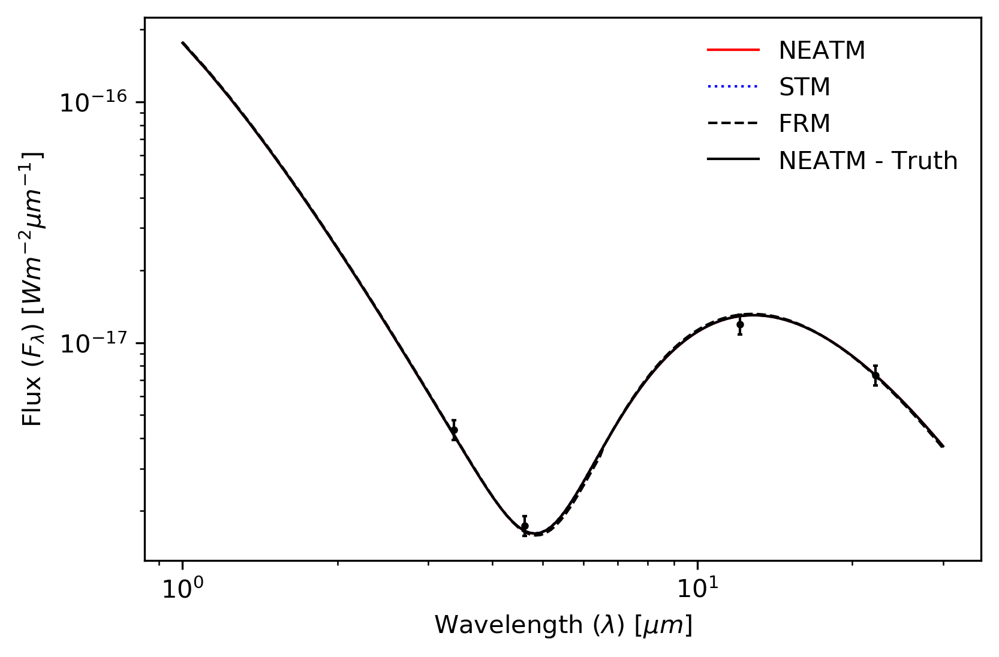

In [100]:
fig, ax = plt.subplots(1, 1, dpi=DPI)
plotSED(SED_neatm_fit, 
        ax=ax, 
        plotKwargs={"label": "NEATM", 
                    "c": "r", 
                    "lw": 1})
plotSED(SED_stm_fit, 
        ax=ax, 
        plotKwargs={"label": "STM", 
                    "c": "b", 
                    "ls": ":", 
                    "lw": 1})
plotSED(SED_frm_fit, 
        ax=ax, 
        plotKwargs={"label": "FRM", 
                    "c": "k", 
                    "ls": "--", 
                    "lw": 1})
plotSED(SED_neatm, 
        ax=ax, 
        plotKwargs={"label":"NEATM - Truth", 
                    "c" : "k" , 
                    "lw": 1})
plotObservations(obs, data, 
                 ax=ax, 
                 plotMedian=True, 
                 columnMapping=columnMapping)
ax.legend(frameon=False)
if SAVE_FIGS is True:
    fig.savefig(os.path.join(SAVE_DIR, "validation_synthetic_case5_SEDs".format(FORMAT)), 
                bbox_inches='tight',
                dpi=DPI)